## Electrocardiograms: models and data

*2015-05-19*

*Jiahao Chen and Jake Bolewski, MIT*

The purpose of this notebook is to develop an understanding for electrocardiogram (ECG) signals. How can we determine important features of these signals to find irregularities that may be symptoms of sickness?

1. This notebook implements a model for normal ECG signals that is described in 
Patrick E. McSharry, Gari D. Clifford, Lionel Tarassenko, and Leonard A. Smith, "A Dynamical Model for Generating Synthetic Electrocardiogram Signals", _IEEE Transactions in Biomedical Engineering_, 50(3), 2003, 289--294.* [doi:10.1109/TBME.2003.808805](http://dx.doi.org/10.1109/TBME.2003.808805)

2. This notebook generates simulated data from the model and analyzes the simulated data using singular value decompositions (SVD), to understand how varying the model's parameters affect the results.

3. This notebook loads some real patient data from the [Multiparameter Intelligent Monitoring in Intensive Care (MIMIC) II database](https://mimic.physionet.org/database.html) and analyzes them with the SVD.

4. This notebook prototypes several feature detectors based on the descriptions of pathologies in ECG textbooks, such as 

  - Barbara J Aehlert, "ECGs Made Easy", 5/e, 2012, Mosby/JEMS.
  - "Chapter 3: Conquering the ECG". In Ashley EA, Niebauer J, "Cardiology Explained", London: Remedica; 2004. http://www.ncbi.nlm.nih.gov/books/NBK2214/

(*Note: there are several discrepancies between parameters used in the paper and the associated code posted [on PhysioNet.org](http://physionet.org/physiotools/ecgsyn/Matlab/), which are noted in comments. We use the parameters in the code where there is disagreement, as those in the paper do not reproduce the figures.)

In [97]:
using Colors
using DataFrames
using Gadfly
using Interact
using ODE
using Optim
using LsqFit
using KernelDensity

In [98]:
#Change the plot size as necessary
set_default_plot_size(1000px, 400px)

In [99]:
function plot_heartbeats(t, mV)
    plot(x=t, y=mV,
         Coord.Cartesian(xmin=t[1], xmax=t[end]),
         Geom.line(preserve_order=true),
         Guide.ylabel("Signal (mV)"),
         Guide.xlabel("Time (s)"),
         Theme(default_color=colorant"black"))
end

plot_heartbeats (generic function with 1 method)

# A simplified model

Here is a version that computes a simplified model that leaves out time variation in the angular frequency parameter $\omega$. 

The necessary time variation comes from an auxiliary process called the RR process, and does not appear to change the simulated signal qualitatively. 

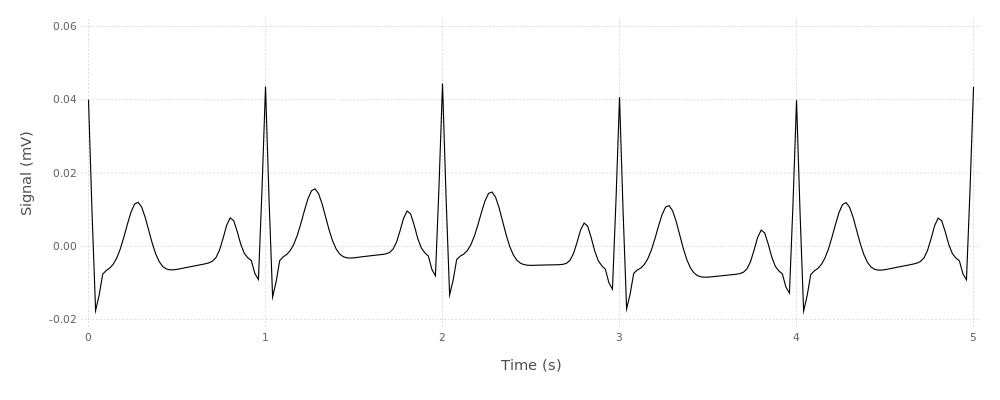

In [100]:
# Parameters  P    Q     R     S     T
a = [1.2, -5.0, 30.0, -7.5, 0.75] # gaussian peak height
b = [0.25, 0.1, 0.1, 0.1, 0.4]    # gaussian peak width
θ = deg2rad([-70, -15, 0, 15, 100]) #gaussian peak position
#θ = [-π/3, -π/12, 0, π/12, -π/2] #Parameters in paper; don't look like their figures...

# This version leaves out the time dependence in ω
# A  respiratory amplitude (mV); default 0.005
#    Note: paper says 0.15, but code says 0.005
# f₂ respiratory frequency (Hz); default 0.25
function F0(t, Y; A=0.005, f₂=0.25, aᵢ=a, bᵢ=b, θᵢ=θ)
    x, y, z = Y
    α = 1 - √(x^2 + y^2)
    ω = 2π
    z₀ = A*sin(2π*f₂*t) #Baseline signal from respiration
    ż = - (z - z₀)
    for i=1:5
        Δθ = rem(atan2(y, x)-θᵢ[i], 2π)
        ż -= aᵢ[i]*Δθ*exp(-Δθ^2/(2bᵢ[i]^2))
    end
    [α*x - ω*y, α*y + ω*x, ż]
end
ts, Ys = ode4(F0, [1.0, 0.0, 0.04], 0:0.02:5);
ys = [Y[3] for Y in Ys]
plot_heartbeats(ts, ys)

# Interacting with the simplified model

Julia makes it easy to explore model parameters and analyze the model interactively.

Here we modify the respiratory frequency parameter $f_2$ and the repiration voltage amplitude $A$. Interactive exploration allows us to peek inside the black box of the model and develop intuition.

Interact.Slider{Float64}(Signal{Float64}(0.025, nactions=0),"A",0.025,0.0:0.001:0.05,true)

Interact.Slider{Float64}(Signal{Float64}(1.0, nactions=0),"f₂",1.0,0.0:0.05:2.0,true)

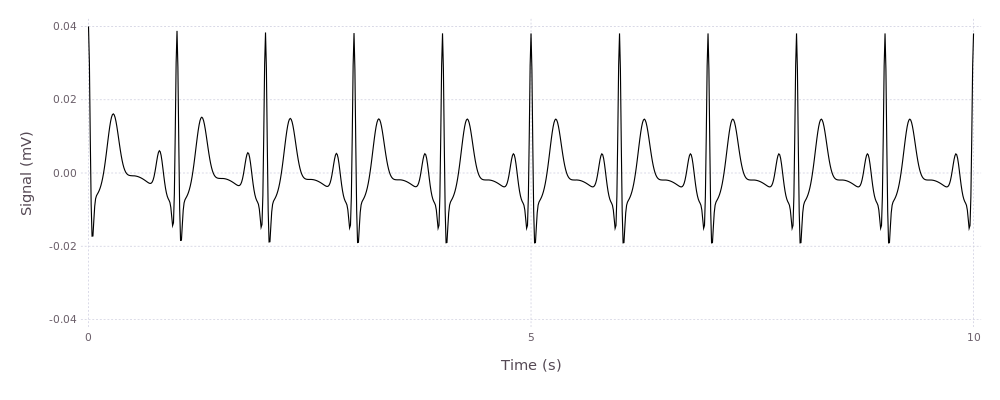

In [101]:
# Parameters  P    Q     R     S     T
@manipulate for A = 0:0.001:0.05, f₂ = 0:0.05:2
    dY_dt = (t,Y) -> F0(t, Y; A=A, f₂=f₂)
    ts, Ys = ode4(dY_dt, [1.0, 0.0, 0.04], 0:0.01:10);
    plot_heartbeats(ts, [Y[3] for Y in Ys])
end

Here we adjust the PQRST Gaussian peak widths $b$ and phase angles $\theta$.  We can quickly gain a sense for the sensitivity of the model to each parameter.

Interact.Slider{Float64}(Signal{Float64}(0.25, nactions=0),"b₁",0.25,0.0:0.05:0.5,true)

Interact.Slider{Float64}(Signal{Float64}(0.25, nactions=0),"b₂",0.25,0.0:0.05:0.5,true)

Interact.Slider{Float64}(Signal{Float64}(0.25, nactions=0),"b₃",0.25,0.0:0.05:0.5,true)

Interact.Slider{Float64}(Signal{Float64}(0.25, nactions=0),"b₄",0.25,0.0:0.05:0.5,true)

Interact.Slider{Float64}(Signal{Float64}(0.25, nactions=0),"b₅",0.25,0.0:0.05:0.5,true)

Interact.Slider{Float64}(Signal{Float64}(-0.7853981633974483, nactions=0),"θ₁",-0.7853981633974483,-1.5707963267948966:0.2617993877991494:0.0,true)

Interact.Slider{Float64}(Signal{Float64}(-0.7853981633974483, nactions=0),"θ₂",-0.7853981633974483,-1.5707963267948966:0.2617993877991494:0.0,true)

Interact.Slider{Float64}(Signal{Float64}(0.7853981633974483, nactions=0),"θ₄",0.7853981633974483,0.0:0.2617993877991494:1.5707963267948966,true)

Interact.Slider{Float64}(Signal{Float64}(0.7853981633974483, nactions=0),"θ₅",0.7853981633974483,0.0:0.2617993877991494:1.5707963267948966,true)

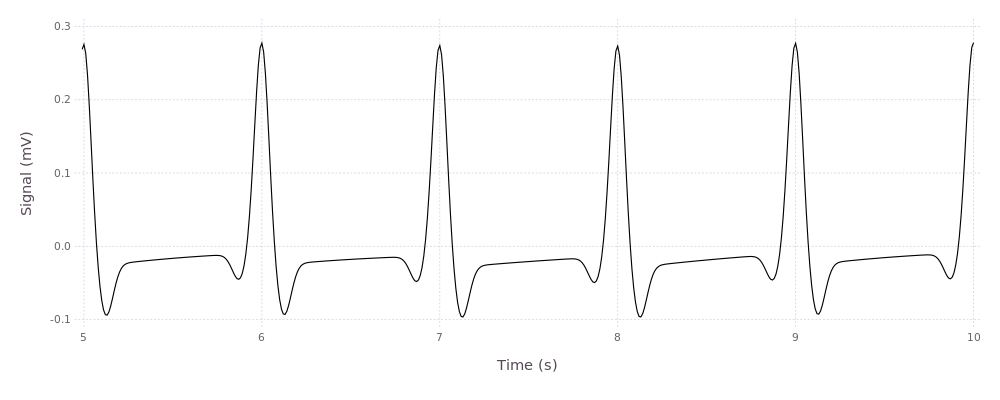

In [102]:
@manipulate for b₁ = 0:0.05:0.5,
                b₂ = 0:0.05:0.5,
                b₃ = 0:0.05:0.5,
                b₄ = 0:0.05:0.5,
                b₅ = 0:0.05:0.5,
        
                θ₁ = -(1/2)π:(π/12):0,
                θ₂ = -(1/2)π:(π/12):0,
                θ₄ = 0:(π/12):π/2,
                θ₅ = 0:(π/12):π/2
        
    bs = [b₁, b₂, b₃, b₄, b₅]
    θs = [θ₁, θ₂, 0, θ₄, θ₅]
    
    dY_dt = (t,Y) -> F0(t, Y, bᵢ=bs, θᵢ=θs)
    ts, Ys = ode4(dY_dt, [1.0, 0.0, 0.04], 0:0.01:10)
    
    idx = length(ts) ÷ 2
    plot_heartbeats(ts[idx:end], [Y[3] for Y in Ys][idx:end])
end

# The full model

The simplified model assumes a constant angular velocity $\omega$ along the $x-y$ unit circle. The actual model in the reference has a time-varying angular velocity which is modulated by the RR process.

## The RR process

The RR process is a model of time intervals between successive heartbeats.

`RRpower` computes a model power spectrum $P$, which consists of two Gaussians in the frequency domain. From this power spectrum, we sample time series with this power spectrum using `powertotimeseries`. Finally we standardize the time series to provide a time series that fits a given distribution of heartbeat intervals (of given mean and standard deviation).


The parameters for the RR process model can be computed from patient heartbeat data.

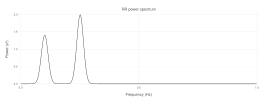

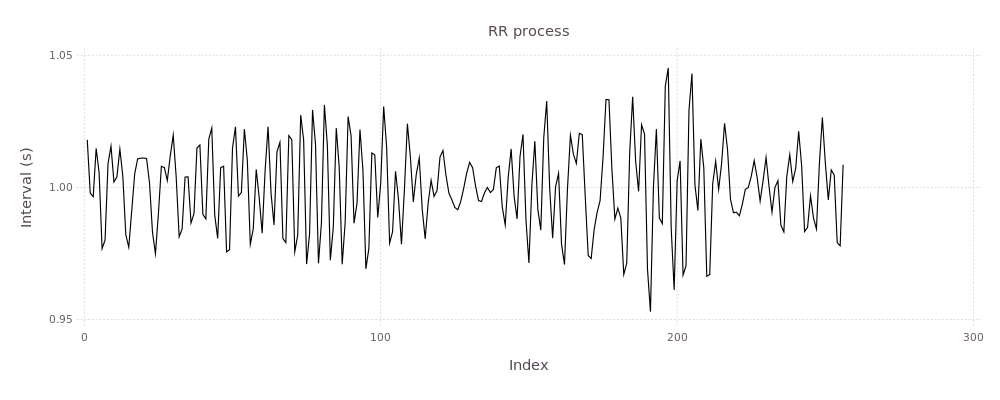

In [103]:
function RRpower{T<:Real}(
    n::Int=0, 
    f₁::T=0.1,
    f₂::T=0.25,
    f₁σ::T=0.01, 
    f₂σ::T=0.01,
    σ₁::Real=0.5, 
    samplefreq::Integer=1)
    
    #Convert from Hz to angular frequencies (rad/s)
    ω₁ = 2π*f₁
    ω₂ = 2π*f₂
    c₁ = 2π*f₁σ
    c₂ = 2π*f₂σ

    df = samplefreq/n
    P = zeros(n)
    for t=0:n-1
        ω = 2π*t*df
        P[t+1] = exp(-0.5*((ω-ω₁)/c₁)^2)*σ₁/c₁ +
                  exp(-0.5*((ω-ω₂)/c₂)^2)/c₂
    end
    return samplefreq/2 * √P
end

#Sample a time series from the given power distribution
function powertotimeseries(f)
    n = length(f)
    f = [f[1:n÷2]; f[n÷2:-1:1]]

    ϕ₀ = 2π*rand(round(Int, n/2-1))
    ϕ = [0, ϕ₀..., 0, -flipdim(ϕ₀, 1)...]
    f̃ = f .* exp(im*ϕ)
    return real(ifft(f̃))/n
end

#Standardize data so that it has the given mean and standard deviation
function standardize(data, μ=0.0, σ=1.0)
    normed = (data - mean(data))/std(data)
    return μ .+ σ * normed
end

Nrr = 256
P = RRpower(Nrr)
draw(SVG(1000px, 400px), plot(Guide.title("RR power spectrum"),
    Guide.xlabel("Frequency (Hz)"), Guide.ylabel("Power (s³)"),
    x=midpoints(0:1/Nrr:1), y=P, Geom.line, Theme(default_color=colorant"black")))

#Heart beat mean and std dev in beats per minute
heartμ=60
heartσ=1 
Ts = standardize(powertotimeseries(P), 60/heartμ, 60*heartσ/(heartμ^2))

plot(Guide.title("RR process"), Guide.xlabel("Index"), Guide.ylabel("Interval (s)"),
    x=1:Nrr, y=Ts, Geom.line, Theme(default_color=colorant"black"))

## Computing the full model

Here is a more elaborate version of the right hand side function which allows for the RR time series to be input.

As can be seen, the default RR model does not appear to change the simulated ECG signal qualitatively.

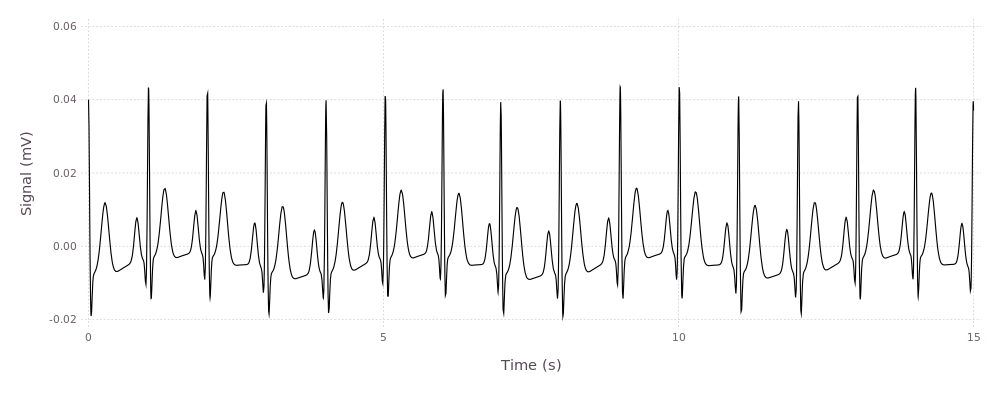

In [104]:
# This version puts in the time dependence in ω
# The instantaneous ω is calculated from the time
# series T with assumed frequency f in Hz
# A  respiratory amplitude (mV); default 0.005
#    Note: paper says 0.15, but code says 0.005
# f₂ respiratory frequency (Hz); default 0.25
function F(t, Y; A=0.005, f₂=0.25, T=Ts, f=1.0)
    x, y, z = Y
    α = 1 - √(x^2 + y^2)
    tidx = 1 + floor(Int, t*f)
    ω = 2π/T[tidx]
    z₀ = A*sin(2π*f₂*t) #Baseline signal from respiration
    ż = - (z - z₀)
    for i=1:5
        Δθ = rem(atan2(y, x)-θ[i], 2π)
        ż -= a[i]*Δθ*exp(-Δθ^2/(2b[i]^2))
    end
    [α*x - ω*y, α*y + ω*x, ż]
end

ts, Ys = ode45(F, [1.0, 0.0, 0.04], 0:0.02:15)
plot_heartbeats(ts, [Y[3] for Y in Ys])

# What happens when you SVD this?

We now look at what the singular value decomposition (SVD) can tell us about families of related time series. Such families can be generated easily from the heartbeat model in many different ways.

## Case 1. Different initial voltage (z0)

In [105]:
tr = 0:0.02:5
data = zeros(length(tr), 0)
for z0=-0.05:0.01:0.05
    ts, Ys = ode4(F, [1.0, 0.0, z0], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

In [106]:
#Plot a given left and right singular vector and also its position in the spectrum of singular values
function svdexplorer(S::Base.LinAlg.SVD, i::Int)
    # Reconstruct dimensions of matrix that was SVDed
    m = size(S[:U], 1) 
    n = size(S[:V], 2)
    ns= size(S[:S], 1)

    leftcolors = reverse(Colors.colormap("Reds", ns+1))
    rightcolors = reverse(Colors.colormap("Blues", ns+1))
    
    hstack(
        #Left singular vector
        plot(x=1:m, y=sub(S[:U],:,i), Geom.line,
            Theme(default_color=leftcolors[i]),
            Coord.Cartesian(xmin=1, xmax=m),
            Guide.xlabel("Time"), Guide.ylabel(""),
            Guide.title("U[$i]")),
    
        #Singular values
        plot(x=1:ns, y=S[:S], Geom.point, Geom.line, 
            xintercept = [i], Geom.vline,
            Theme(default_color=colorant"black"),
            Guide.xlabel("Rank"), Guide.ylabel(""),
            Guide.title("σ[$i] = $(@sprintf("%0.3f", S[:S][i]))")),
    
        #Right singular vector
        plot(x=1:n, y=sub(S[:Vt],i,:), Geom.bar,
            Theme(default_color=rightcolors[i]),
            yintercept=[-1/√n, +1/√n], Geom.hline,
            Guide.xlabel("Record id"), Guide.ylabel(""),
            Coord.Cartesian(xmin=0.5, xmax=n+0.5, ymin=-1.0, ymax=1.0),
            Guide.title("V[$i]")),
    )
end

svdexplorer (generic function with 1 method)

  0.004913 seconds (17 allocations: 30.531 KB)
  

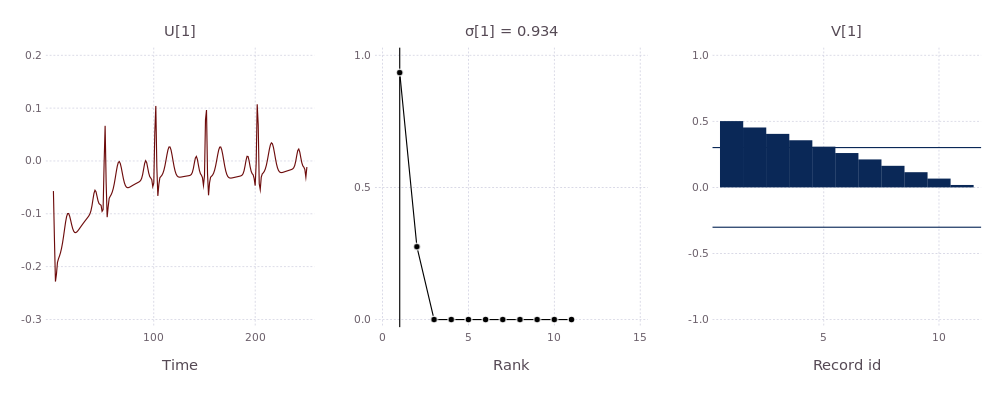

In [107]:
@time S1 = svdfact!(data)
@time svdexplorer(S1, 1)

Interact.Slider{Int64}(Signal{Int64}(6, nactions=0),"i",6,1:11,true)

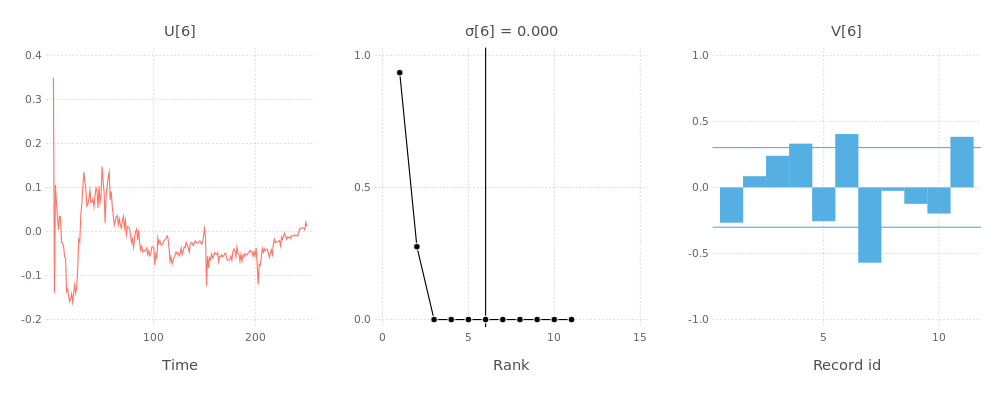

0.148556 seconds (216.40 k allocations: 7.274 MB)


In [108]:
@manipulate for i=1:size(S1[:S], 1)
    svdexplorer(S1, i)
end

## Case 2. Different initial phases

In [109]:
tr = 0:0.02:5
data = zeros(length(tr), 0)
for θ₀=-π:π/6:π
    ts, Ys = ode4(F, [cos(θ₀), sin(θ₀), 0.04], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

  0.000369 seconds (17 allocations: 36.375 KB)
  

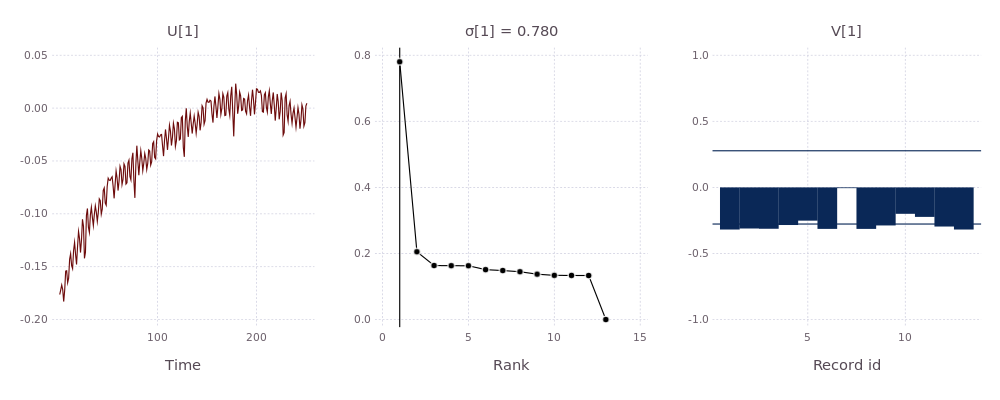

In [110]:
@time S2 = svdfact!(data)
@time svdexplorer(S2, 1)

Interact.Slider{Int64}(Signal{Int64}(7, nactions=0),"i",7,1:13,true)

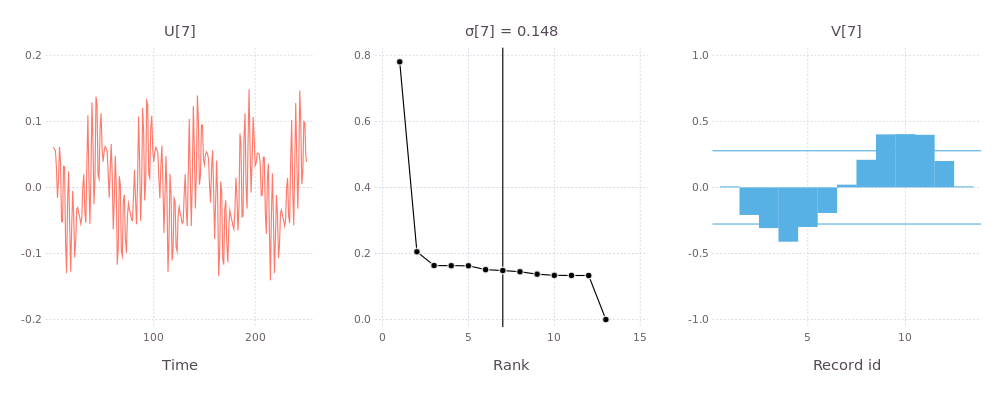

0.100708 seconds (131.56 k allocations: 4.247 MB, 70.03% gc time)


In [111]:
@manipulate for i=1:size(S2[:S], 1)
    svdexplorer(S2, i)
end

## Case 3. Sample different RR time series

In [112]:
tr = 0:0.02:5
data = zeros(length(tr), 0)
for i=1:20
    Ts = standardize(powertotimeseries(P), 60/heartμ, 60*heartσ/(heartμ^2))
    ts, Ys = ode4(F, [1.0, 0.0, 0.04], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

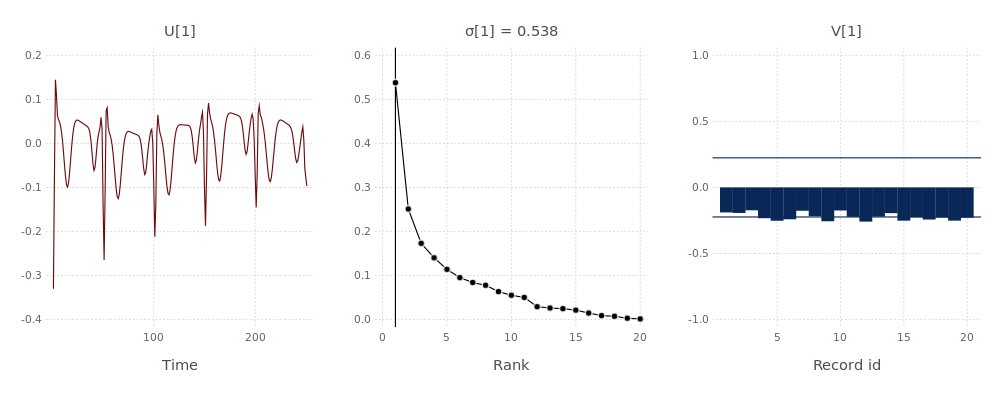

In [113]:
@time S3 = svdfact!(data)
@time svdexplorer(S3, 1)

Interact.Slider{Int64}(Signal{Int64}(10, nactions=0),"i",10,1:20,true)

0.000743 seconds (17 allocations: 57.547 KB)
  0.066371 seconds (135.53 k allocations: 4.953 MB)


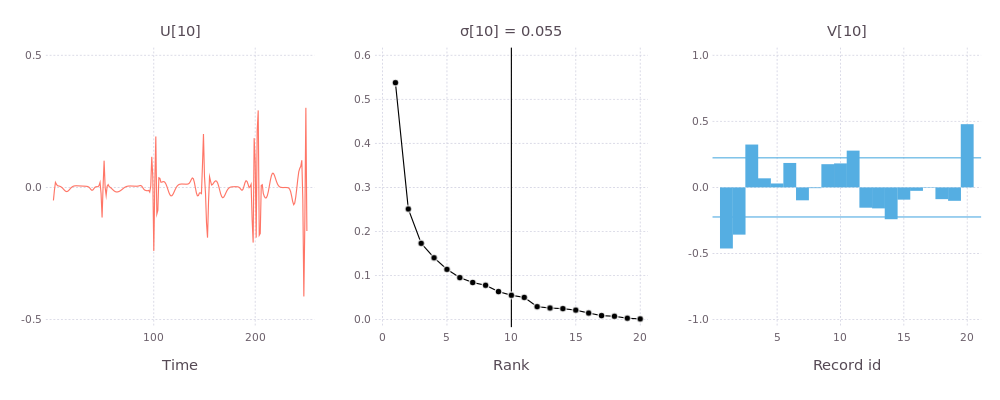

In [114]:
@manipulate for i=1:size(S3[:S], 1)
    svdexplorer(S3, i)
end

## Case 4. Realistic variations in heart beat rate and variability

Let's try some real data from the literature.

The table below is from

Ken Umetani, Donald H Singer, Rollin McCraty, and Mike Atkinson, "Twenty-Four Hour Time Domain Heart Rate Variability and Heart Rate: Relations to Age and Gender Over Nine Decades", _Journal of the American College of Cardiology_, 31 (3), 1998. [doi:10.1016/S0735-1097(97)00554-8](http://content.onlinejacc.org/article.aspx?articleid=1124431)

**Table 2. Aging Effects on 24-h Heart Rate Variability and Heart Rate by Decade**

<table><thead><tr><th align="center">Age (yr)</th><th align="center">SDNN (ms)</th><th align="center">SDANN (ms)</th><th align="center">SDNN Index (ms)</th><th align="center">rMSSD (ms)</th><th align="center">pNN50 (%)</th><th align="center">HR (beats/min)</th></tr></thead><tbody><tr><td align="">10–19</td><td align="center">176 ± 38</td><td align="center">159 ± 35</td><td align="center">81 ± 20</td><td align="center">53 ± 17</td><td align="center">25 ± 13</td><td align="center">80 ± 10</td></tr><tr><td align="">20–29</td><td align="center">153 ± 44</td><td align="center">137 ± 43</td><td align="center">72 ± 22</td><td align="center">43 ± 19</td><td align="center">18 ± 13</td><td align="center">79 ± 10</td></tr><tr><td align="">30–39</td><td align="center">143 ± 32<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">130 ± 33</td><td align="center">64 ± 15<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">35 ± 11<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">13 ± 9<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">78 ± 7</td></tr><tr><td align="">40–49</td><td align="center">132 ± 30<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">116 ± 31<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">60 ± 13<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">31 ± 11<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">10 ± 9<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">78 ± 7</td></tr><tr><td align="">50–59</td><td align="center">121 ± 27<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">106 ± 27<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">52 ± 15<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">25 ± 9<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">6 ± 6<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">76 ± 9</td></tr><tr><td align="">60–69</td><td align="center">121 ± 32<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">111 ± 31<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">42 ± 13<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong><strong data="tblfn4"><sup>d</sup></strong></td><td align="center">22 ± 6<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">4 ± 5<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">77 ± 9</td></tr><tr><td align="">70–79</td><td align="center">124 ± 22<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">114 ± 20<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">43 ± 11<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong><strong data="tblfn4"><sup>d</sup></strong></td><td align="center">24 ± 7<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">4 ± 5<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">72 ± 9</td></tr><tr><td align="">80–99</td><td align="center">106 ± 23<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">95 ± 24<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">37 ± 12<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong><strong data="tblfn4"><sup>d</sup></strong></td><td align="center">21 ± 6<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">3 ± 3<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">73 ± 10</td></tr></tbody></table></div></div></div></div><div class="tableFoot"><div class="para clearfix"><a name="489670"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">a</span>p &lt; 0.05, other age ranges versus 10 to 19 years.</div><div class="para clearfix"><a name="489672"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">b</span>p &lt; 0.05, other age ranges versus 20 to 29 years.</div><div class="para clearfix"><a name="489674"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">c</span>p &lt; 0.05, other age ranges versus 30 to 39 years.</div><div class="para clearfix"><a name="489676"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">d</span>p &lt; 0.05, other age ranges versus 40 to 49 years. Data presented are mean value ± SD. HR = heart rate; pNN50 = percentage of successive normal sinus RR intervals >50 ms; rMSSD = root-mean-square of the successive normal sinus RR interval difference; SDANN = standard deviation of the averaged normal sinus RR intervals for all 5-min segments; SDNN = standard deviation of all normal sinus RR intervals over 24 h; SDNN index = mean of the standard deviations of all normal sinus RR intervals for all 5-min segments.

In [115]:
npatients = 65 #Same as in the study
tr = 0:0.02:300 #seconds
data = zeros(length(tr), 0)
for i=1:npatients
    heartμ = randn()*7 + 78 #HR in bpm, 40-49 year olds
    heartσ = randn()*0.031 + 0.116 #SDANN, 40-49 year olds
    P = RRpower(2*round(Int,300(60/heartμ)))
    Ts = standardize(powertotimeseries(P), 60/heartμ, heartσ)
    ts, Ys = ode4(F, [1.0, 0.0, 0.04], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

Interact.Slider{Int64}(Signal{Int64}(33, nactions=0),"patient_id",33,1:65,true)

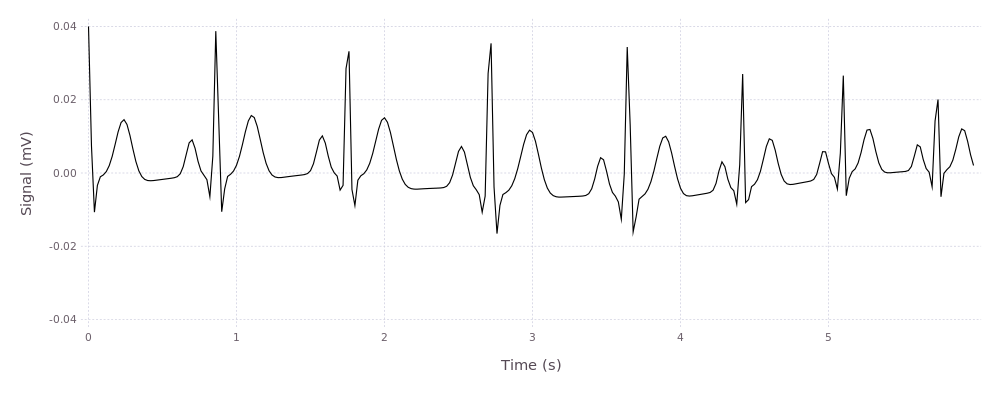

In [116]:
#Inspect the data
@manipulate for patient_id=1:npatients
    plot_heartbeats(ts[1:300], data[1:300, patient_id])
end

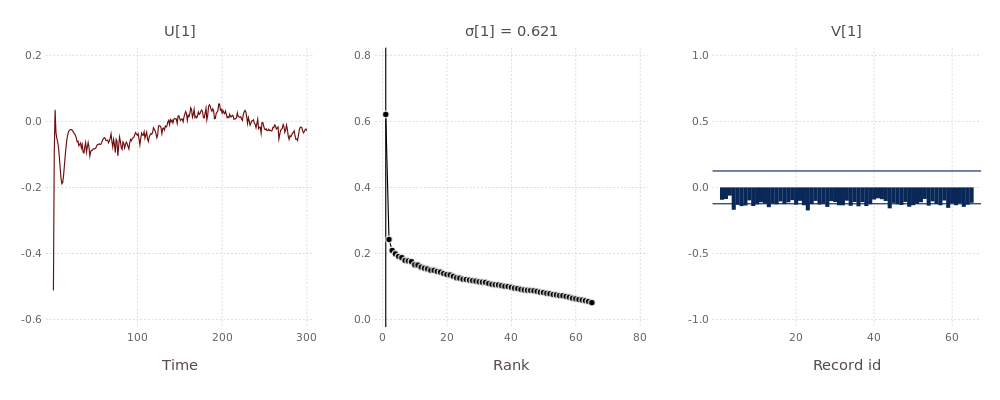

In [117]:
@time S4 = svdfact(data[1:300, :])
@time svdexplorer(S4, 1)

Interact.Slider{Int64}(Signal{Int64}(33, nactions=0),"i",33,1:65,true)

0.017569 seconds (28 allocations: 629.328 KB)
  0.065010 seconds (145.38 k allocations: 4.873 MB)


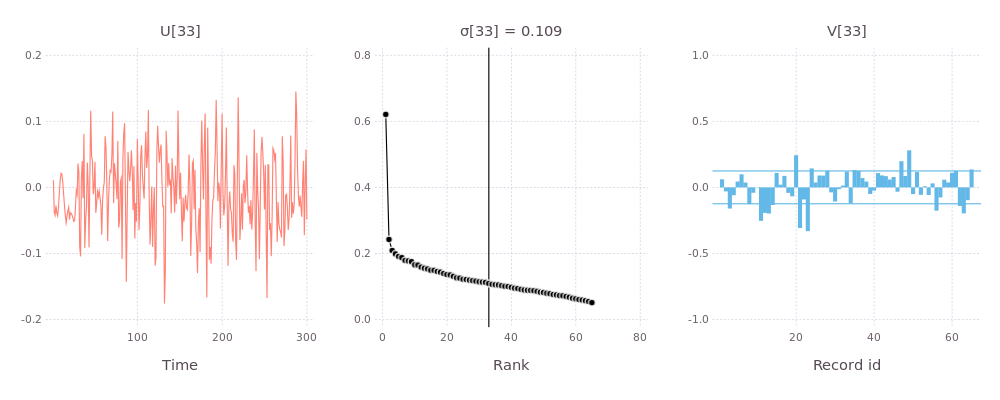

In [118]:
@manipulate for i=1:size(S4[:S], 1)
    svdexplorer(S4, i)
end

Interact.Slider{Int64}(Signal{Int64}(33, nactions=0),"i",33,1:65,true)

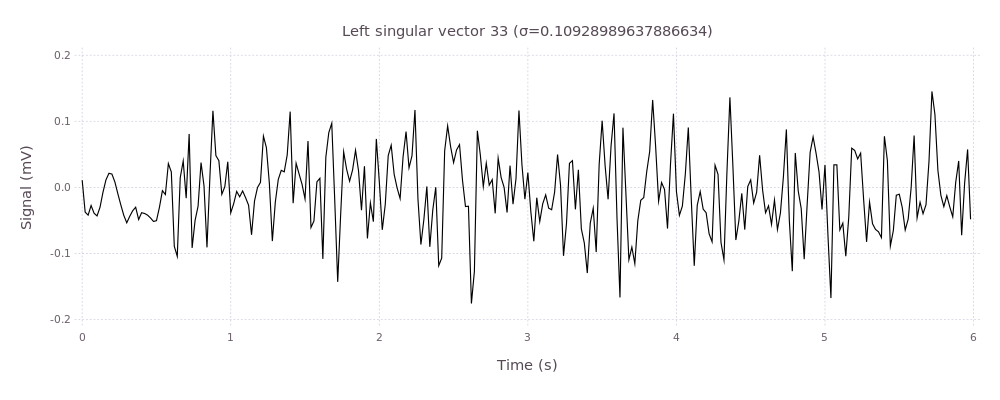

In [119]:
#Inspect the results of the SVD
@manipulate for i=1:size(S4[:S], 1)
    plot(Guide.xlabel("Time (s)"), Guide.ylabel("Signal (mV)"), Guide.title("Left singular vector $i (σ=$(S4[:S][i]))"),
         x=ts[1:300], y=S4[:U][1:300,i], Geom.line(preserve_order=true), Theme(default_color=colorant"black"))
end

## Summary

In all the cases we've seen, variations in the input parameters cause the SVD to no longer be of rank 1.

The largest singular vector looks like a weighted average.

The second largest singular vector looks like the derivative of the largest singular vector.

The remaining singular vectors are clustered closely together.

# Comparing the model to real MIMIC heartbeat data

Here we load in some representative ECG data from the MIMIC dataset.  

This raw data is from patient ID 3482117, representing 20 different 8 minute snapshots of ECG data sampled at 125 HZ.

In [120]:
path = pwd()
if !("hbeatdata" in readdir(path))
    error("""Cannot find hbeatdata directory in $path.
          Please change the path variable in this cell and try again.""")
end
HB_filenames = readdir(joinpath(path, "hbeatdata"))
HB_filepaths = map(p -> joinpath(path, "hbeatdata", p), HB_filenames)
rawdata = [readtable(p) for p in HB_filepaths]
println("Loaded $(length(rawdata)) files.")

Loaded 20 files.


In [121]:
#rawdata[1]

To run the SVD we first need to clean up the parsed raw data and build an observation matrix.

First we reject any ECG traces that have missing values, or are all zero voltage.  We then convert voltage data from the DataFrame object into a Julia Array and select the first 10,000 datapoints (about 1.3 minutes of data at 125 Hz).  Finally, we concat all the vectors together to build our matrix in order to perform the SVD.  The rows of the matrix are the voltage values for each timepoint, the columns are the different heartbeat traces from patient ID 3482117.

In [122]:
# filter raw heatbeat data
records = Array[]
for df in rawdata
    if !anyna(df[:mV]) && !all(v -> v == 0, df[:mV])
        push!(records, convert(Array, df[:mV][1:10_000]))
    end
end
hbeats = hcat(records...);

We want to visualize the heartbeat data to do a quick sanity check of the raw data.  

**Note** We are omitting preprocessing steps which would be required for any serious analysis of the raw data.

In [123]:
#Function to plot raw data
function plotraw(data, pts...)
    sd = size(data)
    if length(sd)==2
        m, n = sd
    else #one-dimensional
        m = sd[1]
        n = 0
    end

    cmap = Colors.distinguishable_colors(n)
    xs = 1:8:(m*8)

    npts = length(pts)
    cmap2 = Colors.distinguishable_colors(npts, colorant"red")

    #Plot only pts within range of the data
    truncpts = map(x->x[1.≤x.≤m], pts)

    if n==0
        datalayers = [layer(x=xs, y=sub(data,:), Geom.line,
            Theme(default_color=colorant"black"))]
        ptslayers = [layer(x=xs[ps], y=data[ps], Geom.point,
            Theme(default_color=cmap2[ips]))
            for (ips, ps) in enumerate(truncpts)]
    else
        datalayers = [layer(x=xs,
                y=sub(data,:,i), Geom.line,
                Theme(default_color=cmap[i])) for i in 1:n]
        ptslayers = [layer(x=xs[ps], y=data[ps], Geom.point,
            Theme(default_color=cmap2[ips]))
            for (ips, ps) in enumerate(truncpts)]
    end
    
    plot(Guide.xlabel("Time (ms)"), Guide.ylabel(""), Guide.title("Raw data"),
         Coord.Cartesian(ymin=-0.5, ymax=0.5),
        datalayers..., ptslayers...)
end

plotraw (generic function with 2 methods)

Interact.Slider{Int64}(Signal{Int64}(6, nactions=0),"recordᵢ",6,1:12,true)

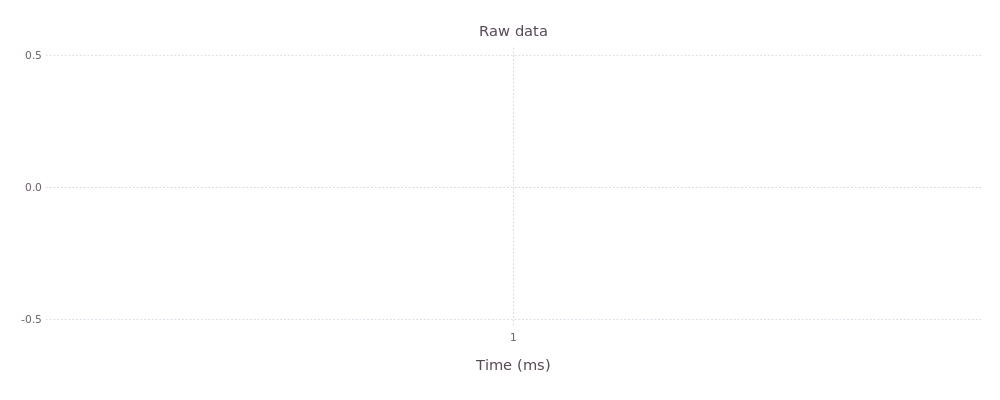

In [124]:
@manipulate for recordᵢ=1:size(hbeats, 2)
    plotraw(hbeats[:7000, recordᵢ:recordᵢ])
end

It is apparent that the last two heartbeat traces are a bit wonky.  Something went wrong with data collection or with our pipeline to read in the data from the binary waveform files.  This needs more investiagation, but for now lets just throw out the last two columns of our observation matrix.   

In [125]:
# extract out patients data that makes sense
obsmat = copy(sub(hbeats, :, 1:10))

10000x10 Array{Float64,2}:
 -0.15625    -0.131313   0.024   0.0    …  0.0     0.0     0.056   0.025974 
 -0.0729167  -0.0707071  0.016   0.0       0.0     0.0     0.048   0.038961 
 -0.0104167  -0.010101   0.056   0.0       0.008   0.008   0.0     0.038961 
  0.03125     0.010101   0.072   0.0       0.008   0.008  -0.064   0.038961 
  0.0416667   0.020202   0.064   0.0       0.008  -0.016  -0.096   0.025974 
  0.0520833   0.030303   0.04    0.008  …  0.008  -0.08    0.0     0.025974 
  0.0520833   0.040404   0.032   0.008     0.008  -0.144   0.152   0.038961 
  0.0520833   0.030303   0.032   0.008     0.008  -0.104   0.176   0.038961 
  0.0520833   0.030303   0.04    0.016     0.016   0.056   0.088   0.025974 
  0.0520833   0.030303   0.056   0.016     0.016   0.168   0.032  -0.012987 
  0.0520833   0.020202   0.08    0.024  …  0.016   0.112   0.016  -0.0779221
  0.0520833   0.020202   0.096   0.024     0.016   0.032   0.008  -0.103896 
  0.0520833   0.020202   0.088   0.032     0.016 

Interact.Slider{Int64}(Signal{Int64}(5, nactions=0),"recordᵢ",5,1:10,true)

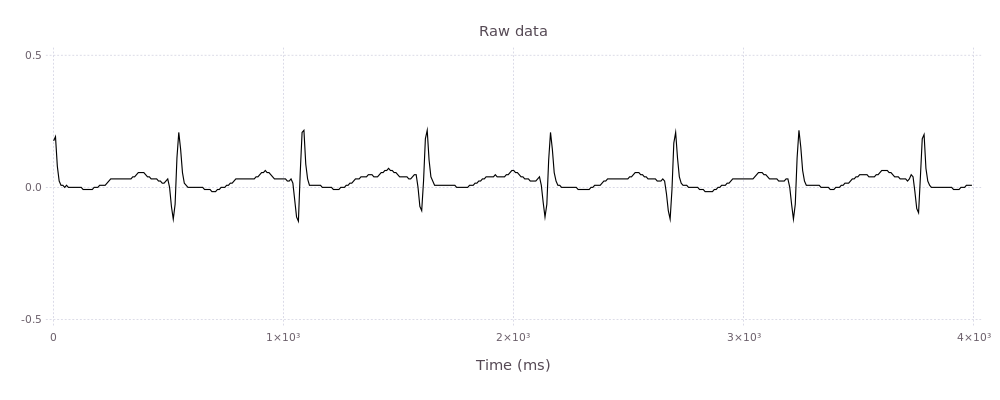

In [126]:
@manipulate for recordᵢ=1:size(obsmat, 2)
    plotraw(obsmat[1:500, recordᵢ:recordᵢ])
end

### Exploring the SVD of the raw heartbeat data

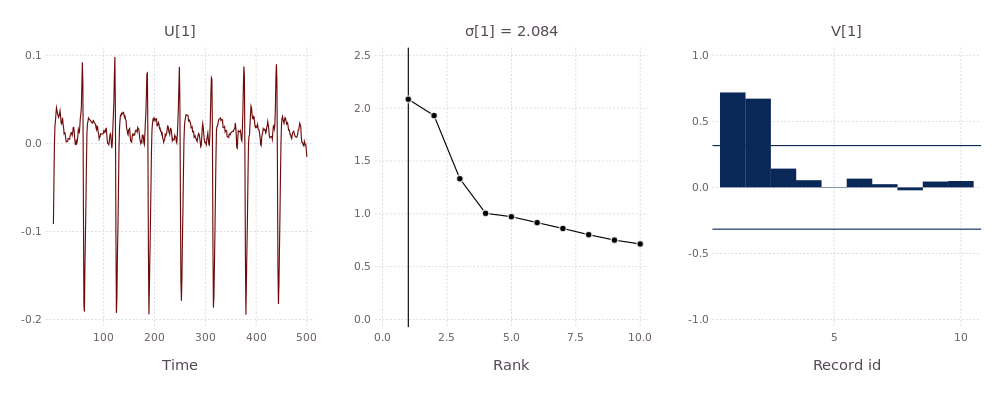

In [127]:
S5 = svdfact(obsmat[1:500,:])
svdexplorer(S5, 1)

Interact.Slider{Int64}(Signal{Int64}(5, nactions=0),"sval",5,1:10,true)

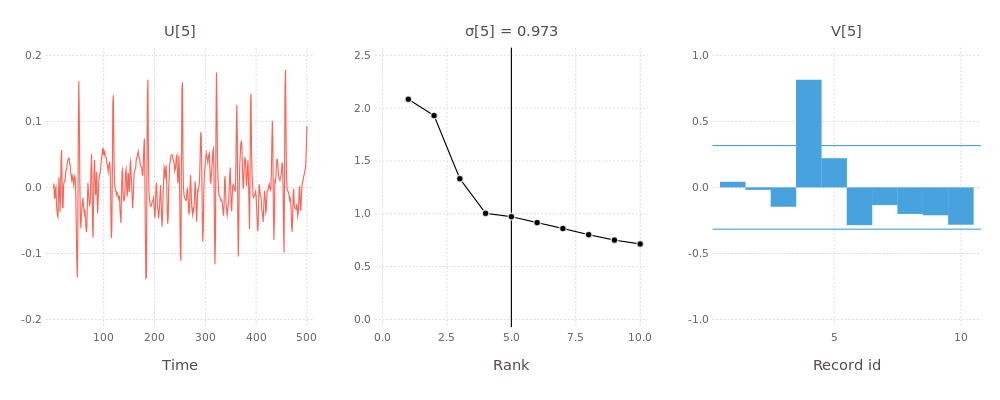

In [128]:
@manipulate for sval = 1:size(S5[:S], 1)
    svdexplorer(S5, sval)
end

We can inspect the results of the SVD more closely by zooming into different regions of the singular vectors interactively.

In [129]:
function plot_left_singular(S::Base.LinAlg.SVD, i::Integer=1; range::Union{Range, Colon}=:)
    m  = size(S[:U], 1) # Reconstruct dimensions of matrix that was SVDed
    n  = size(S[:V], 2)
    ns = size(S[:S], 1)
    
    leftcolors = reverse(colormap("Reds", ns+1))
    rightcolors = reverse(colormap("Blues", ns+1))

    isa(range, Colon) && (range = 1:m)
    xdata = range
    ydata = sub(S[:U], range, i)
    
    plot(x=xdata*8, y=ydata, Geom.line,
         Theme(default_color=leftcolors[i]),
         Coord.Cartesian(xmin=xdata.start*8, xmax=xdata.stop*8),
         Guide.xlabel("Time (ms)"), 
         Guide.ylabel(""),
         Guide.title("Left singular vector $i (σ = $(S[:S][i]))"))
end

plot_left_singular (generic function with 2 methods)

Interact.Slider{Int64}(Signal{Int64}(5, nactions=0),"sval",5,1:10,true)

Interact.Slider{Int64}(Signal{Int64}(1, nactions=0),"lbound",1,1:500:1,true)

Interact.Slider{Int64}(Signal{Int64}(1, nactions=0),"ubound",1,1:500:1,true)

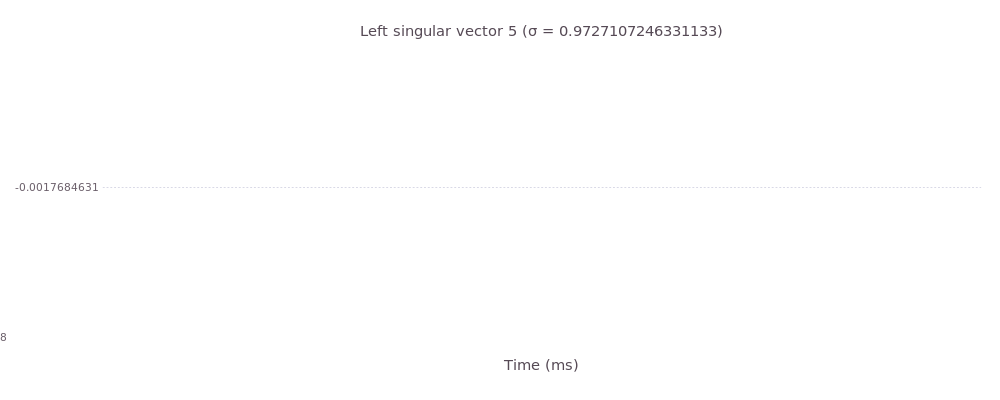

In [130]:
@manipulate for sval = 1:size(S5[:S], 1),
                lbound = 1:500:size(S5[:U], 1),
                ubound = 1:500:size(S5[:U], 1)
    lbound = min(lbound, ubound)
    ubound = max(lbound, ubound)
    plot_left_singular(S5, sval, range=lbound:ubound)
end

# Summary

It is clear that the raw ECG data from actual patients requires significant cleanup before we can analyze it with sophisticated tools. Nevertheless, we can already see how effective the SVD is at picking out representative ECG signals from the data.

# Cleanup: Peak detection

As we saw above, the misalignment of the R-R peaks in the ECG lead to smearing of the singular vectors. The first thing to do is find the R peaks (the tall, skinny peaks) and try to find them algorithmically.

It turns out that the AMPD peak detector is very useful for our problem.

In [131]:
#Simple peak detector using first derivative test - no longer used
function findpeaks(data, minspacing::Int=0)
    d=diff(data)
    upeaks=Int[]
    dpeaks=Int[]
    inplateau = false
    zerostart = (0, zero(eltype(data)), zero(eltype(data)))
    for i=1:length(data)-2
        if !inplateau #Find sharp peaks or onset of plateau
            if d[i+1]<0 && d[i] > 0
                push!(upeaks, data[i+1] > data[i] ? i+1 : i)
            elseif d[i+1]>0 && d[i] < 0
                push!(dpeaks, data[i+1] > data[i] ? i : i+1)
            elseif d[i+1]==0 #Shallow up peak
                zerostart = (i, data[i], d[i])
                inplateau = true
            end
        else #Tracing a flat peak
            if d[i+1] != 0
                inplateau = false
                
                #make sure we actually have a change in gradient
                d[i+1] * zerostart[3] < 0 || continue
                
                #We have a problem where
                #at zerostart[1], the value is zerostart[2] and the 
                # gradient was zerostart[3]
                #at i+1, the value is data[i+1] and the gradient is d[i+1]
                #Find the intersection point!
                s1 = zerostart[3]
                s2 = d[i+1]
                pk = (s1*zerostart[1] - s2*(i+1))/(s1 - s2)
                peak = round(Int, pk)

                if s2<0 #&& s1 > 0
                    push!(upeaks, peak)
                else #if s2>0 && s1 < 0
                    push!(dpeaks, peak)
                end
            end
        end
    end
    upeaks, dpeaks
end

findpeaks (generic function with 2 methods)

In [132]:
function ampd(x, y, α::Real = 1.0; mode::Symbol=:max, full::Bool=false, λ=nothing)
    #Linearly detrend - fit to straight line and subtract it
    model(x, p) = p[1].*x + p[2]
    fit = curve_fit(model, x, y, zeros(2))
    p = fit.param
    y -= x.*p[1] + p[2]

    #Computing local maxima scalogram
    N = length(y)
    L = λ==nothing ? (ceil(Int, N/2)-1) : λ
    M = α .+ rand(L, N)
    for k=1:L #Scale of signal
        for i=k+2:N-k+1
            if mode == :max
                (y[i-1] > y[i-k-1] && y[i-1] > y[i+k-1]) && (M[k, i] = 0)
            elseif mode == :min
                (y[i-1] < y[i-k-1] && y[i-1] < y[i+k-1]) && (M[k, i] = 0)
            end
        end
    end

    #Compute row-wise summation
    γ = sum(M, 2)
    λ==nothing && ((_, λ) = findmin(γ))

    #Detect peaks
    σ = map(i->std(sub(M, 1:λ, i)), 3:N)

    z = find(x->x==0, σ) .+ 1
    
    full ? (z, M, σ, λ, γ) : z
end

ampd (generic function with 2 methods)

The original AMPD problem scans over a large number of windows. In this case we can use some domain knowledge, that heart rates have a physiological maximum (see, e.g. [Wikipedia models for maximal heart rates](http://en.wikipedia.org/wiki/Heart_rate#Maximum_heart_rate)). Most models agree that 220 bpm is a maximum upper bound, which corresponds to a period of 0.273 s, or 34 units (8ms per unit). So we can simply scan until we hit a window of 34 units.

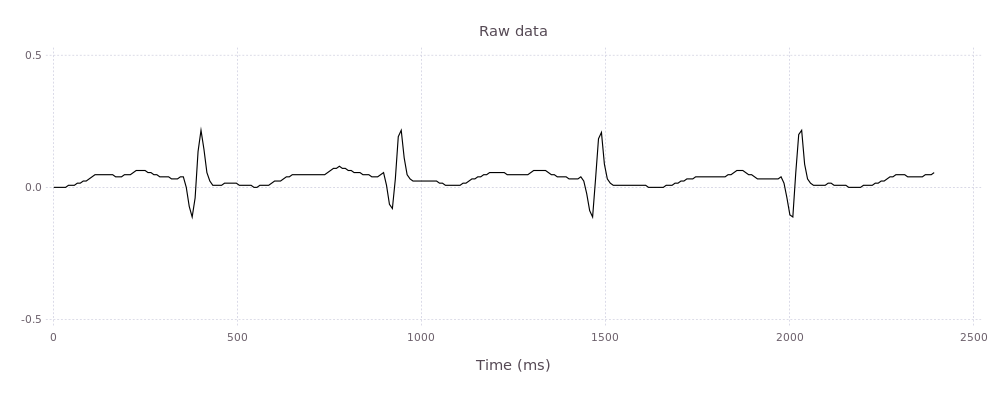

In [133]:
patient = 4
data = obsmat[:, patient:patient]
plotraw(data[1:300,:])

In [134]:
Rs = ampd(1:1000, data[1:1000, 1], λ=34)

14-element Array{Int64,1}:
  51
 119
 187
 255
 322
 390
 458
 525
 593
 660
 728
 795
 863
 930

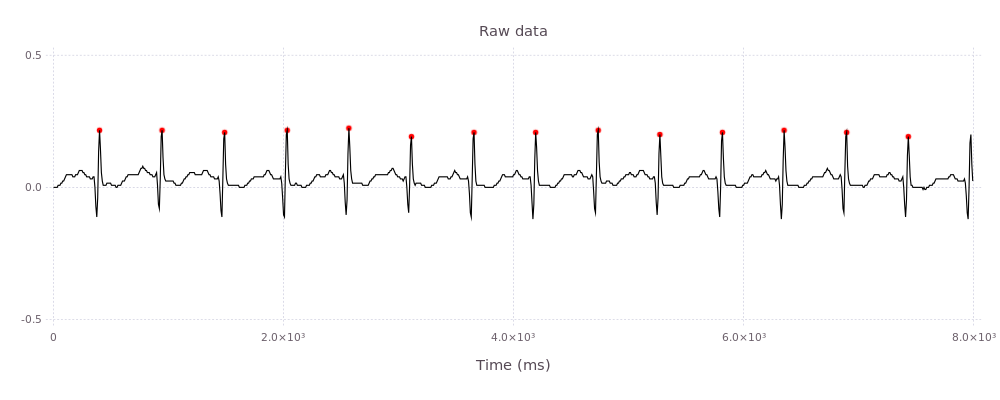

In [135]:
plotraw(data[1:1000, :], Rs)

## Detect inversion

Some of these heartbeat signals have inverted voltages - the R peak points downward instead of up. So we'll check the minima as well.

In [136]:
Rd = ampd(1:1000, data[1:1000, 1], mode=:min, λ=34)

14-element Array{Int64,1}:
  48
 116
 184
 252
 319
 387
 455
 522
 590
 657
 725
 792
 860
 927

In [137]:
m1, m2 = maximum(data[Rs]), minimum(data[Rd])

(0.224,-0.12)

In [138]:
#Check if we are flipped, and find the R peaks
tol=0.25
if abs(m1) > abs(m2) #Normal case, assign up peaks to R spike
    inverted = false
else
    inverted = true
    Rs = -Rd
end;

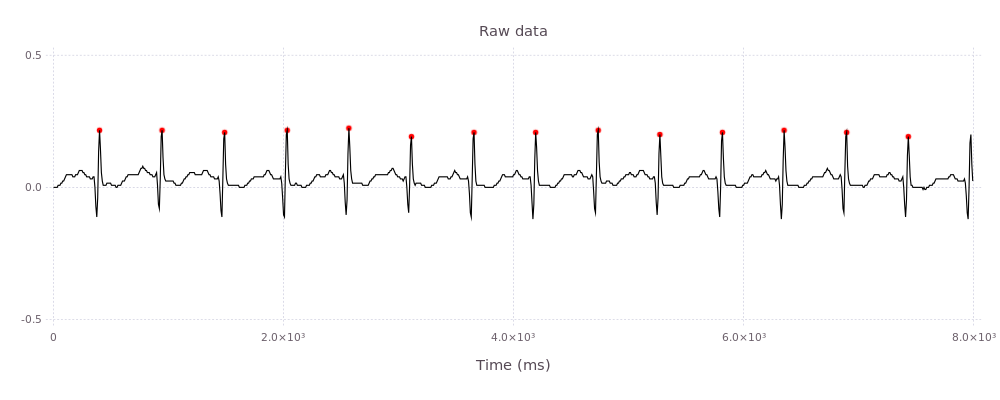

In [139]:
plotraw((inverted ? (-1):(1))*data[1:1000, :], Rs)

In [140]:
#Compute statistics of mean time between Rs
RRs=diff(Rs)/125
mean(RRs), std(RRs)/√(length(RRs)-1)

(0.540923076923077,0.0011694106924093736)

## Reconstruct RR spectrum

To reconstruct the RR process power spectrum, we compute the angular frequencies corresponding to the empirically observed RR periods, and then find their kernel density estimate. Then, we apply a peak detection pass to find peaks, take the two largest peaks, and use them to do a nonlinear least squares fit.

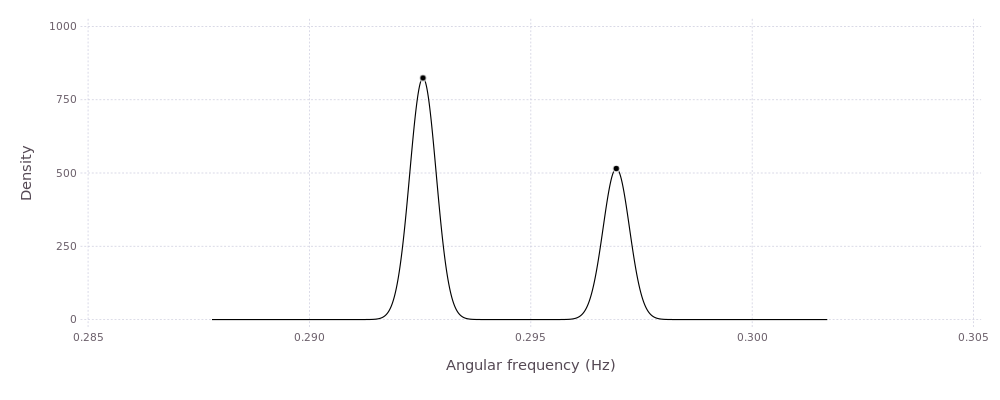

In [141]:
x=kde_lscv(1.0/2π./RRs)
z=ampd(x.x, x.density)
plot(Guide.xlabel("Angular frequency (Hz)"), Guide.ylabel("Density"), 
    Theme(default_color=colorant"black"),
    layer(x=x.x[z], y=x.density[z], Geom.point),
    layer(x=x.x, y=x.density, Geom.line))

19051.89530072133 (predicted_residual) >
19051.895300721317 (residual) + 3.637978807091713e-12 (eps)
19051.89530072133 (predicted_residual) >
19051.895300721317 (residual) + 3.637978807091713e-12 (eps)


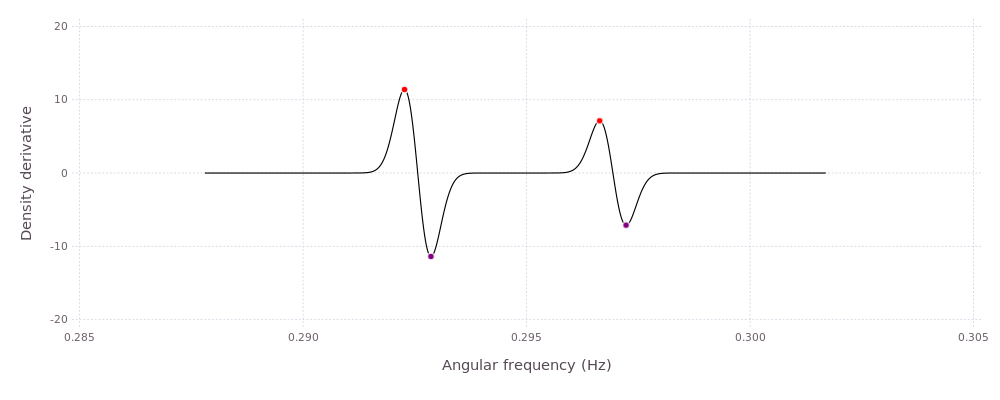

In [142]:
#Compute fwhm from extrema of derivative
x2=midpoints(x.x)
y2=diff(x.density)
z2=ampd(x2, y2)
z3=ampd(x2, y2, mode=:min)
plot(
    Guide.xlabel("Angular frequency (Hz)"), Guide.ylabel("Density derivative"), 
        Theme(default_color=colorant"black"),
    layer(x=x2[z2], y=y2[z2], Geom.point, Theme(default_color=colorant"red")),
    layer(x=x2[z3], y=y2[z3], Geom.point, Theme(default_color=colorant"purple")),
    layer(x=x2, y=y2, Geom.line))

In [143]:
#Find two largest peaks
peaks = Any[]
for i=1:2
    y, j = findmax(x.density[z])

    _, jp = findmax(y2[z2])
    _, jm = findmin(y2[z3])
    σ = abs(x2[z3[jm]]-x2[z2[jp]])/(2*√(2log(2)))
    push!(peaks, (y, x.x[z[j]], σ))

    deleteat!(z, j)
    deleteat!(z2, jp)
    deleteat!(z3, jm)
end

#Use peak detection sweep to provide initial guesses for least squares sweep
model(x, p) = p[1].*exp(-((x-p[2])./(2p[3])).^2) + p[4].*exp(-((x-p[5])./(2p[6])).^2)
fit = curve_fit(model, x.x, x.density, [peaks[1]..., peaks[2]...])
fit.param

6-element Array{Float64,1}:
 824.216      
   0.292564   
   0.000210621
 515.135      
   0.296931   
   0.000210621

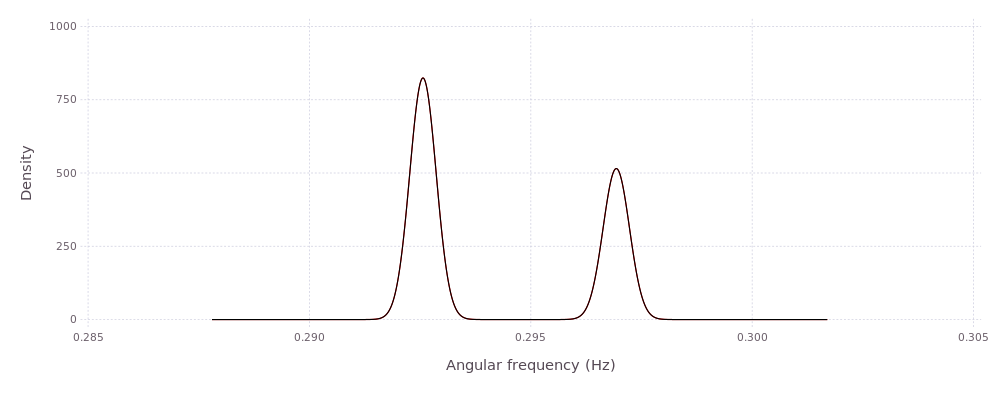

In [144]:
plot(Guide.xlabel("Angular frequency (Hz)"), Guide.ylabel("Density"), 
    layer(x=x.x, y=model(x.x, fit.param), Geom.line, Theme(default_color=colorant"black")),
    layer(x=x.x, y=x.density, Geom.line, Theme(default_color=colorant"red")),
)

## Find other peaks

We now apply the AMPD peak detector at a lower scale to determine the other peaks.

The $\theta$ parameters in the differential equation model correspond to peak placements.

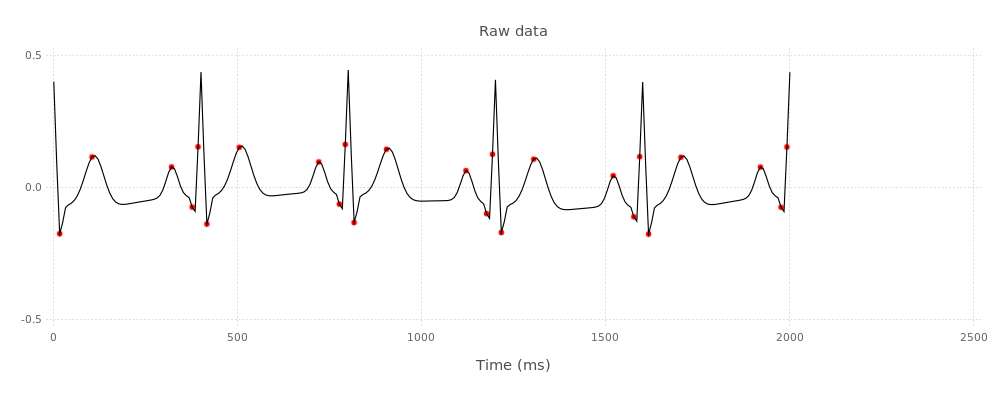

 in depwarn at deprecated.jl:73
 in oldstyle_vcat_warning at ./abstractarray.jl:29
 in vect at abstractarray.jl:32
 in anonymous at no file
 in include_string at loading.jl:266
 in execute_request_0x535c5df2 at /home/jiahao/.julia/v0.4/IJulia/src/execute_request.jl:177
 in eventloop at /home/jiahao/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading In[145], in expression starting on line 1


In [145]:
plotraw(10ys, [[50i+ceil(Int, 50((θ/(2π)))) for i=0:5]...])

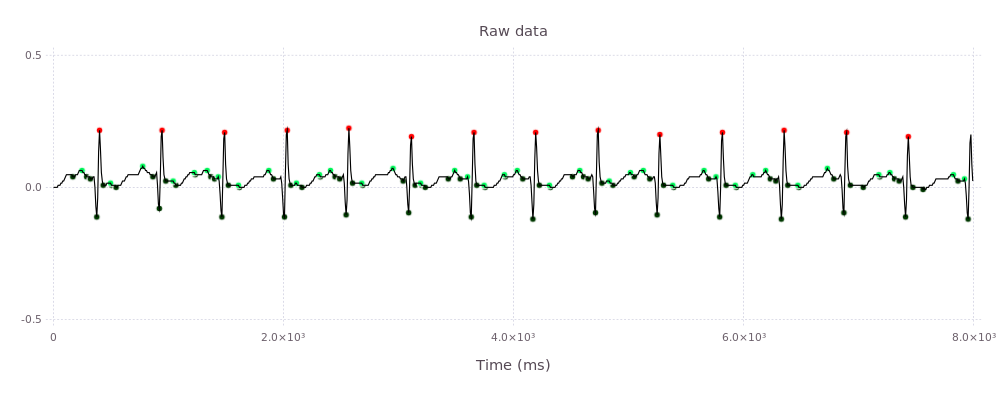

In [146]:
dps = ampd(1:1000, data[1:1000, 1], mode=inverted ? :max : :min, λ=3)
ups = ampd(1:1000, data[1:1000, 1], mode=inverted ? :min : :max, λ=5)
ups = setdiff(ups, Rs)
plotraw((inverted ? (-1):(1))*data[1:1000, :], Rs, ups, dps)

Now try to find S, T, P, and Q peaks.

The heuristic is that

- S is the first down peak after an R
- T is the first up peak after an R
- P is the last up peak before the next R
- Q is the last down peak before the next R

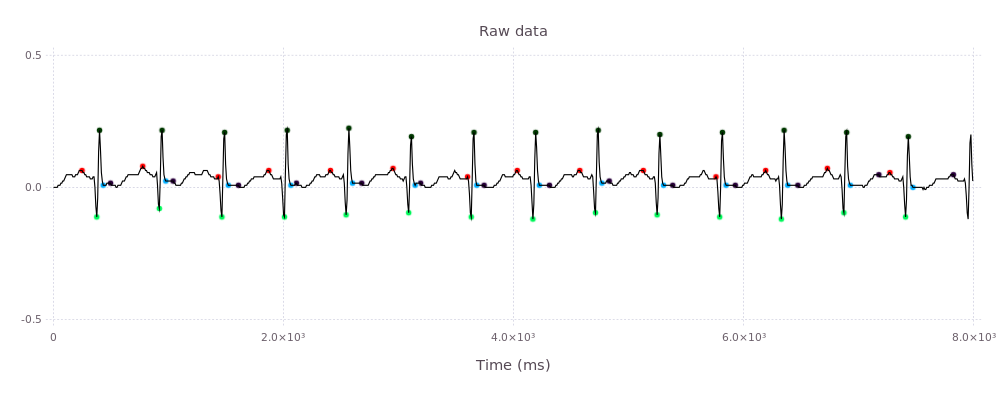

In [147]:
wholebeats = Tuple{Int, Int, Int, Int, Int}[]
Ps = Int[]
Qs = Int[]
Ss = Int[]
Ts = Int[]
for (i, R) in enumerate(Rs)
    id = findfirst(x->x>R, dps)
    iu = findfirst(x->x>R, ups)
    (id==0 || iu==0) && continue
    P = ups[iu-1]
    Q = dps[id-1]
    if i>1 && !(P > Rs[i-1] && Q > Rs[i-1])
        continue
    end
    S = dps[id]
    T = ups[iu]
    if i<length(Rs) && !((S < Rs[i+1]) && (T < Rs[i+1]))
        continue
    end
    push!(wholebeats, (P, Q, R, S, T))
    push!(Ps, P); push!(Qs, Q); push!(Ss, S); push!(Ts, T)
end
plotraw((inverted ? (-1):(1))*data[1:1000, :], Ps, Qs, Rs, Ss, Ts)

## Extracting breathing signal

Recall from the ODE model that respiration contributes a slow, pure sinusoidal signal.

Interact.Slider{Float64}(Signal{Float64}(0.0, nactions=0),"A",0.0,-0.1:0.01:0.1,true)

Interact.Slider{Float64}(Signal{Float64}(7.4, nactions=0),"T",7.4,0.0:0.2:15.0,true)

Interact.Slider{Float64}(Signal{Float64}(3.141592653589793, nactions=0),"θ",3.141592653589793,0.0:0.2617993877991494:6.283185307179586,true)

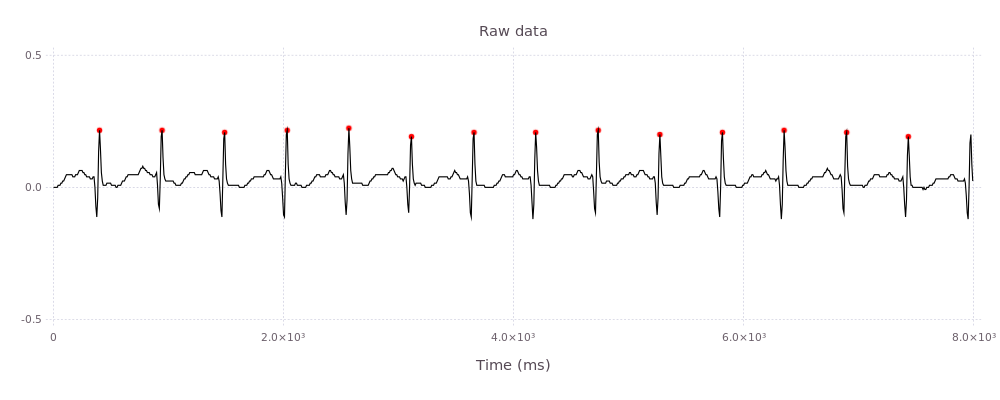

In [148]:
@manipulate for A=-0.1:0.01:0.1, T=0:0.2:15, θ=0:π/12:2π
    plotraw(data[1:1000, :].-map(t->A*sin(θ+2π*t/(125*T)), 1:1000), Rs)
end

We can use FFT to extract this breathing signal.

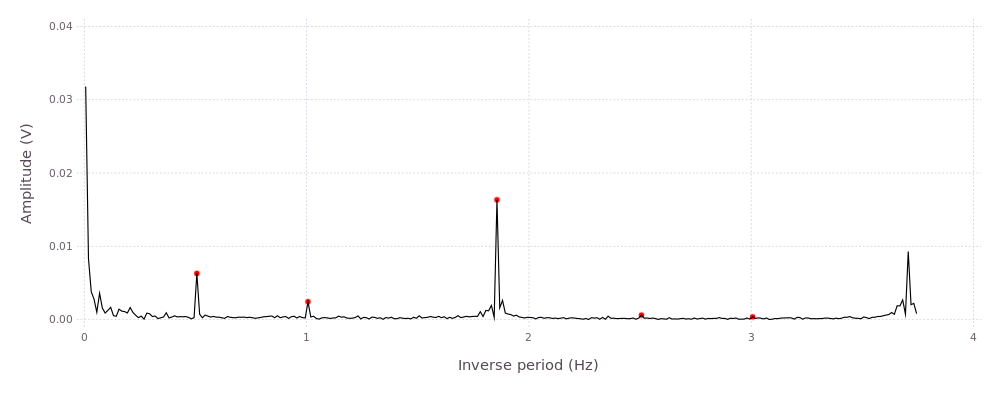

In [149]:
f = rfft(data[1:10000, 1]) / (10000/2)
fa = abs(f)
freqs = midpoints((-1+1:300)/10000/0.008)
peaks = ampd(1:300, fa[1:300], λ=20)
plot(Theme(default_color=colorant"black"), Guide.ylabel("Amplitude (V)"),
    Guide.xlabel("Inverse period (Hz)"),
    layer(x=freqs, y=fa[1:300], Geom.line),
layer(x=freqs[peaks], y=fa[1:300][peaks], Geom.point, Theme(default_color=colorant"red")),
)

In [150]:
#Compute amplitude
f0 = (peaks[1]-1)/10000/0.008 #Period in seconds
A = fa[peaks[1]]
println("Frequency: $f0 Hz\nAmplitude: $A V")
ϕ0 = angle(f[peaks[1]])/2

Frequency: 0.5 Hz
Amplitude: 0.006294865856179905 V


-1.4217457726225127

Now that we have some estimate for the amplitude, frequency and initial phase of the breathing signal $z_0$, we can refine it using an optimization algorithm. We also need to compute the initial phase (a nuisance parameter).

Use a simple derivative-free Nelder-Mead method from Optim.jl

In [151]:
fop(p) = 
    sumabs(data[Qs, 1]-mean(data[Qs, 1])-map(t->p[1].*sin(p[2]+2π*p[3]*t), Qs./125)) +
    sumabs(data[Rs, 1]-mean(data[Rs, 1])-map(t->p[1].*sin(p[2]+2π*p[3]*t), Rs./125))

fit = optimize(fop, [A, ϕ0, f0])

Results of Optimization Algorithm
 * Algorithm: Nelder-Mead
 * Starting Point: [0.006294865856179905,-1.4217457726225127, ...]
 * Minimum: [0.006415668463157725,-1.590117240868341, ...]
 * Value of Function at Minimum: 0.168456
 * Iterations: 111
 * Convergence: true
   * |x - x'| < NaN: false
   * |f(x) - f(x')| / |f(x)| < 1.0e-08: true
   * |g(x)| < NaN: false
   * Exceeded Maximum Number of Iterations: false
 * Objective Function Calls: 205
 * Gradient Call: 0

In [152]:
A, ϕ0, f0 = fit.minimum;

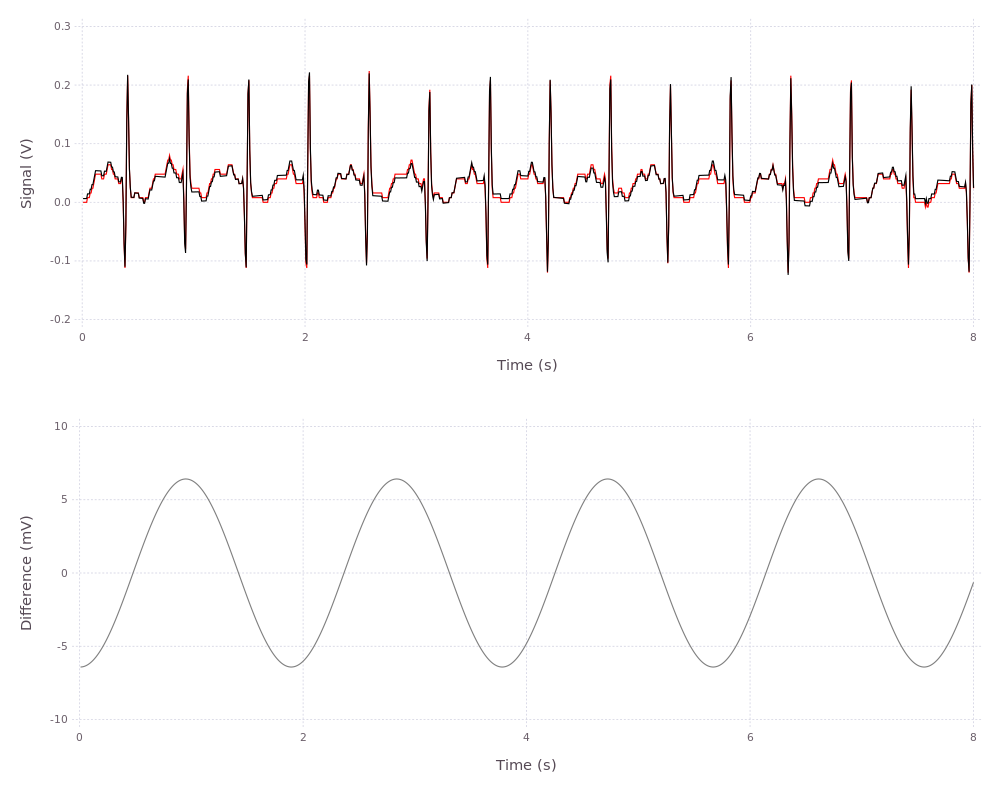

In [153]:
p = fit.minimum
ybase = map(t->p[1]*sin(p[2]+2π*p[3]*t), (1:1000)/125)
ycorr = data[1:1000, 1].-ybase
draw(PNG(1000px, 800px), vstack(
  plot(Guide.xlabel("Time (s)"), Guide.ylabel("Signal (V)"),
    layer(x=(1:1000)/125, y=ycorr,
        Geom.line, Theme(default_color=colorant"black")),
    layer(x=(1:1000)/125, y=data[1:1000, 1], Geom.line, Theme(default_color=colorant"red")),
  ),
  plot(Guide.xlabel("Time (s)"), Guide.ylabel("Difference (mV)"),
    layer(x=(1:1000)/125, y=1000ybase, Geom.line, Theme(default_color=colorant"grey")),
  )
))

## Estimate peak heights

Now that we have a baseline corrected signal, we can estimate peak heights.

In [154]:
beatheights = zeros(0, 5)
baselinex = Int[]
baseliney = Float64[]
for complex in wholebeats
    beatheights = [beatheights; ycorr[[complex...]]']
end
beatheights

14x5 Array{Float64,2}:
 0.0683173  -0.11003    0.217477  0.00880508  0.0154414 
 0.0745365  -0.0863988  0.209585  0.0176258   0.0179238 
 0.0403882  -0.110933   0.209568  0.0102204   0.0118636 
 0.0704089  -0.106108   0.221671  0.0133203   0.0206822 
 0.0629334  -0.107726   0.219869  0.0113709   0.0103653 
 0.0661075  -0.100189   0.188212  0.00478335  0.0137073 
 0.045372   -0.106286   0.213929  0.0141055   0.0143841 
 0.0681895  -0.118357   0.209143  0.0084653   0.00659822
 0.0582857  -0.102414   0.209596  0.00967361  0.018042  
 0.0626895  -0.102765   0.201733  0.0103797   0.0118635 
 0.0460762  -0.106177   0.213589  0.013223    0.0120587 
 0.0627654  -0.123863   0.21174   0.00325442  0.00221007
 0.0661075  -0.100059   0.204351  0.00493215  0.0500592 
 0.0598634  -0.106286   0.197929  0.00620173  0.0519251 

In [155]:
function sim(A, ϕ, f₂, V0, a, b, θ)
    ts, Ys = ode4((t, Y)->F0(t, Y; A=A, f₂=f₂, aᵢ=a, bᵢ=b, θᵢ=θ),
        [cos(ϕ), sin(ϕ), V0], 0:0.01:5);
    ys = [Y[3] for Y in Ys]
    ts, ys
end

sim (generic function with 1 method)

In [156]:
phases = 2π*collect(wholebeats[1])/(125*RRs[1])
phases = [phases[4:5]-2π; phases[1:3]-π]
[phases θ]

5x2 Array{Float64,2}:
 -1.2012    -1.22173 
 -0.461999  -0.261799
 -0.1848     0.0     
  1.2936     0.261799
  1.5708     1.74533 

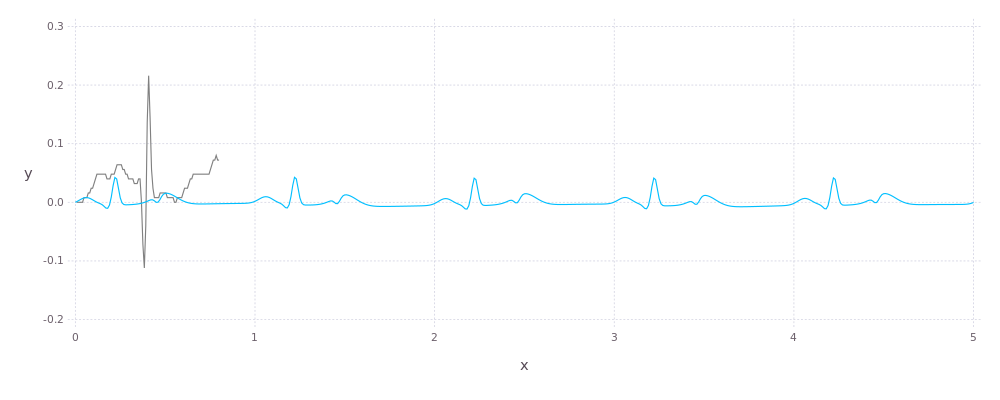

In [157]:
t, y = sim(A, ϕ0, f0, data[1,1], a, b, phases)
plot(
    layer(x=t, y=y, Geom.line),
    layer(x=(1:100)/125, y=data[1:100, 1], Geom.line, Theme(default_color=colorant"grey"))
)


The P and T components of the waveform can be difficult to resolve... I think for now, just stick to finding the QRS complex, which is very sharply defined.

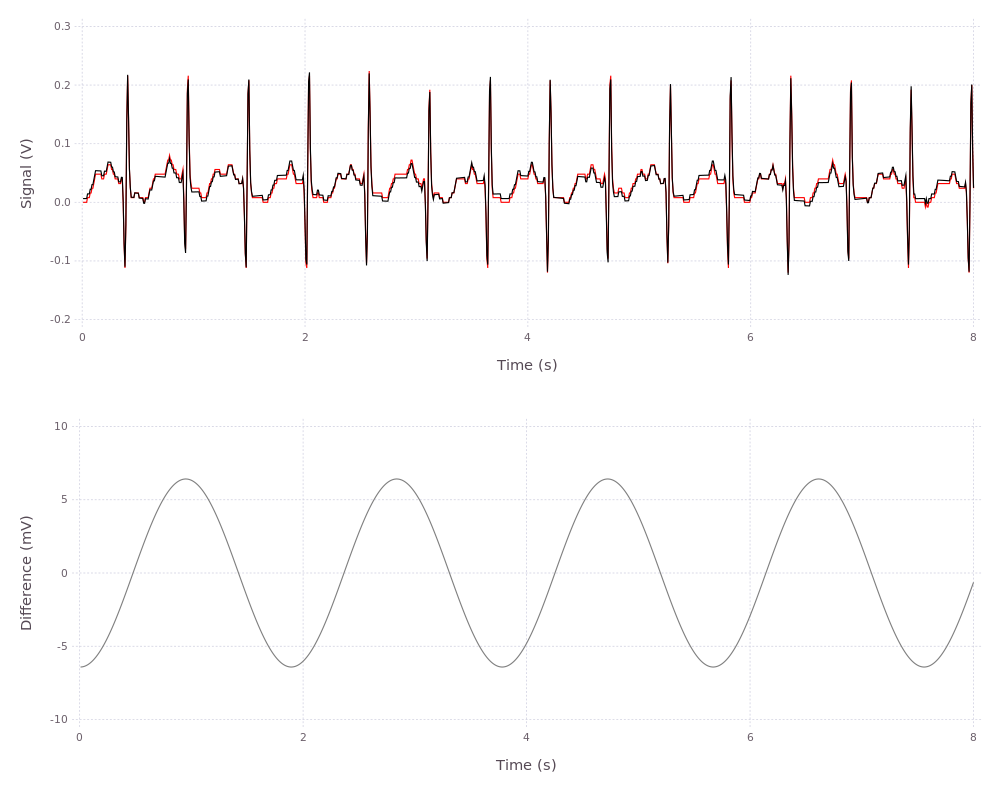

In [158]:
p = fit.minimum
ybase = map(t->p[1]*sin(p[2]+2π*p[3]*t), (1:1000)/125)
draw(PNG(1000px, 800px), vstack(
  plot(Guide.xlabel("Time (s)"), Guide.ylabel("Signal (V)"),
    layer(x=(1:1000)/125, y=data[1:1000, 1].-ybase,
        Geom.line, Theme(default_color=colorant"black")),
    layer(x=(1:1000)/125, y=data[1:1000, 1], Geom.line, Theme(default_color=colorant"red")),
  ),
  plot(Guide.xlabel("Time (s)"), Guide.ylabel("Difference (mV)"),
    layer(x=(1:1000)/125, y=1000ybase, Geom.line, Theme(default_color=colorant"grey")),
  )
))

# Detecting abnormalities

In this section, I try out some diagnostics described in

> "Chapter 3: Conquering the ECG". In Ashley EA, Niebauer J, "Cardiology Explained", London: Remedica; 2004. http://www.ncbi.nlm.nih.gov/books/NBK2214/

> ## Rate
>
> Identify the QRS complex (this is generally the biggest wave); count the number of large squares between one QRS wave and the next; divide 300 by this number to determine the rate (see Table 2).

From this description we can deduce that 1 large square represents a time interval of 0.2s.

In [159]:
#Compute heartbeat rate
RRs = diff(Rs)
periods = RRs ./125 #periods in seconds
bpm = 60./periods #in beats per minute
println("Heartbeat rate = ", round(mean(bpm), 2), " ± ", round(std(bpm)/√(length(bpm)-1), 2), " bpm")

Heartbeat rate = 110

We can also visualize the variation of each statistic.

In [160]:
function viz(
        X::AbstractVector, #Input data vector
        threshold=nothing, #Threshold; if nothing, ignored
        X̄=nothing,      #Mean if known, otherwise, computed from X
        σX=nothing      #Standard error of mean if known, otherwise, computed from X
    ;
        plotX0::Bool=true,   #Force plot to include 0?
        nσ::Real=2, #How many standard deviations to plot as an interval
        label::AbstractString="", #Description
        datacolor=colorant"black", #Color of data bars
        meancolor=colorant"grey25", #Color of mean
        meanerrorcolor=colorant"grey75", #Color of mean error interval
        thresholdcolor=colorant"red", #Color of threshold
        thresholddatacolor=colorant"maroon", #Color of data bars exceeding threshold
    )
    
    nX = length(X)
    #Compute mean if necessary
    if X̄==nothing
        X̄ = mean(X)
    end

    #Compute standard error if necessary
    if σX==nothing
        σX = std(X)/√(nX-1)
    end

    layers = Any[]

    plotX0 && push!(layers, Coord.Cartesian(ymin=min(maximum(X), 0)))
    
    #Plot threshold
    if threshold != nothing
        yintercepts = isa(threshold, AbstractVector) ? threshold : [threshold]
        push!(layers, layer(yintercept=yintercepts, Geom.hline, Theme(default_color=thresholdcolor)))

        for t in threshold
            xs = X .> t
            Xhighlight = zeros(X)
            Xhighlight[xs] = X[xs]
            length(xs) > 0 && push!(layers, layer(x=1:nX, y=Xhighlight, Geom.bar, Theme(default_color=thresholddatacolor)))
        end
    end

    #Plot intervals
    push!(layers, layer(x=1:nX, y=X, Geom.bar, Theme(default_color=datacolor)))
    
    #Plot mean
    push!(layers, layer(yintercept=[X̄], Geom.hline, Theme(default_color=meancolor)))

    #Plot error interval of mean
    push!(layers, layer(yintercept=[X̄-nσ*σX, X̄+nσ*σX], Geom.hline, Theme(default_color=meanerrorcolor)))
    
    ctx = Compose.compose(Compose.context(0, 0.2, 1Compose.w, 0.15), Compose.rectangle(), fill("red"))
    plot(Guide.xlabel("Index"), Guide.ylabel(label), layers..., Guide.annotation(ctx))
end

viz (generic function with 4 methods)

From the Reference, the population mean heartbeat rate 77.4 +/- 8.7 bpm. Let's try setting a threshold to be 3 sigma over the population mean.

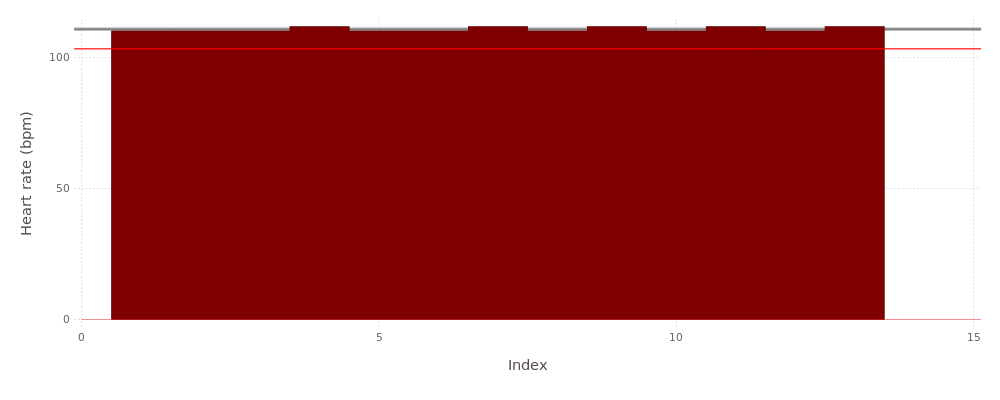

.93 ± 0.24 bpm


In [161]:
viz(bpm, 103.4, label="Heart rate (bpm)")

In [162]:
function plotraw(data, r::Range, pts...)
    n = size(data, 2)
    cmap = Colors.distinguishable_colors(n)
    xs = 8r

    npts = length(pts)
    cmap2 = Colors.distinguishable_colors(npts, colorant"red")

    #Plot only pts within range of the data
    truncpts = map(x->x[r.start .≤ x .≤ r.stop], pts)

    plot(Guide.xlabel("Time (ms)"), Guide.ylabel(""), Guide.title("Raw data"),
         Coord.Cartesian(ymin=-0.5, ymax=0.5),
        [layer(x=xs,
                y=sub(data, r, i), Geom.line,
                Theme(default_color=cmap[i])) for i in 1:n]...,
        [layer(x=8ps, y=data[ps], Geom.point, Theme(default_color=cmap2[ips]))
            for (ips, ps) in enumerate(truncpts)]...)
end

plotraw (generic function with 2 methods)

Interact.Slider{Int64}(Signal{Int64}(5000, nactions=0),"i",5000,1:10000,true)

Interact.Slider{Int64}(Signal{Int64}(7500, nactions=0),"j",7500,5001:10000,true)

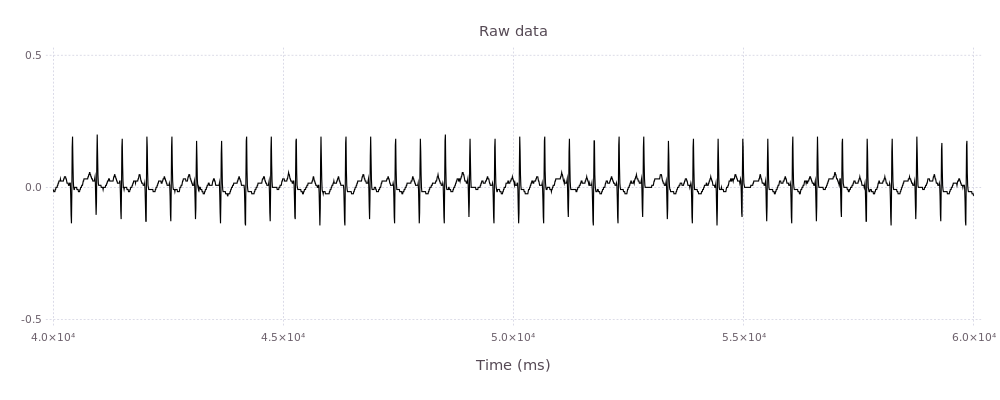

In [163]:
@manipulate for i=1:length(data), j=i.value+1:length(data)
    plotraw((inverted ? (-1):(1))*data, i:j, Ps, Qs, Rs, Ss, Ts)
end

> ## No P waves and irregular narrow QRS complexes
> 
> This is the hallmark of atrial fibrillation (see Figure 7). Sometimes the baseline appears "noisy" and sometimes it appears entirely flat. However, if there are no P waves and the QRS complexes appear at randomly irregular intervals, the diagnosis is atrial fibrillation.

The description in the text is rather vague.

Looking at Figure 7:

<img src="http://www.ncbi.nlm.nih.gov/books/NBK2214/bin/ch3f7.jpg" width=700/>

we can try to narrow down what "randomly irregular intervals" means. In the example given in the figure, the R-R spacings are 23, 14, 19, 12, 14, 21, 21, and 16 small squares. At 0.04s per small square, the standard error of the mean R-R spacing is 0.061s, or 8.7% of the mean of 0.70s. So let's try taking a cutoff for the standard error of the mean to be 0.02s.

In [164]:
## Check R-R interval variation
# The example given in Figure 7 has a standard deviation of 0.16s (23% of mean)
# Here, choose cutoff to be 0.05s
RRs = diff(Rs)/125
σxRR = std(RRs)/√(length(RRs)-1)
if σxRR > 0.02
    println("Unusual R-R interval variation detected: standard error of mean is ", round(σxRR, 5), " s > 0.02s")
else
    println("Standard error of mean R-R interval = ", round(σxRR, 5), " s < 0.02s")
end

Standard error of mean R-R interval = 0.

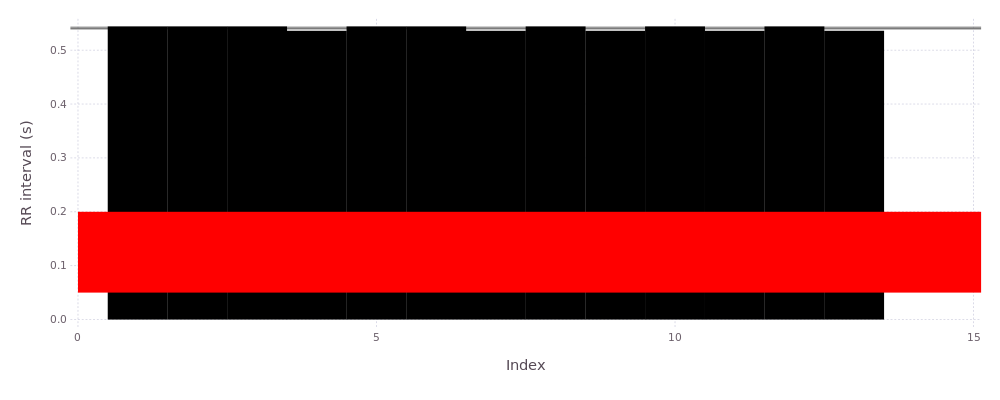

00117 s < 0.02s


In [165]:
viz(RRs, label="RR interval (s)")

In [166]:
#z=ampd(1:1000, data[1:1000, 1])
(z, M, σ, λ, γ) = ampd(1:1000, data[1:1000, 1], full=true)
σ = map(i->std(M[1:28, i]), 3:1000)
z = find(x->x==0, σ) .+ 1

14-element Array{Int64,1}:
  51
 119
 187
 255
 322
 390
 458
 525
 593
 660
 728
 795
 863
 930

In [167]:
#z2=ampd(1:1000, data[1:1000, 1], mode=:min)
(_, M2, _, _, _) = ampd(1:1000, data[1:1000, 1], mode=:min, full=true)
σ = map(i->std(M2[1:40, i]), 3:1000)
z2 = find(x->x==0, σ) .+ 1

14-element Array{Int64,1}:
  48
 116
 184
 252
 319
 387
 455
 522
 590
 657
 725
 792
 860
 927

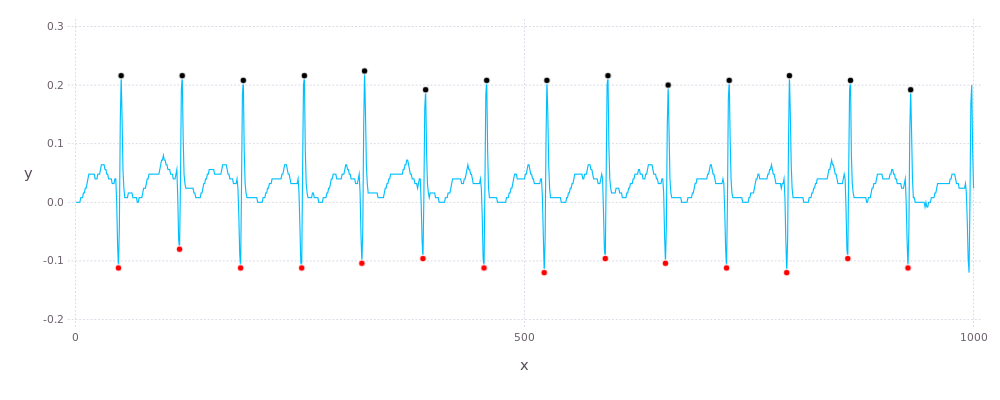

In [168]:
plot(layer(x=z, y=data[z, 1], Geom.point, Theme(default_color=colorant"black")), 
layer(x=z2, y=data[z2, 1], Geom.point, Theme(default_color=colorant"red")),
    layer(x=1:1000, y=data[1:1000, 1], Geom.line))

In [169]:
z, M, σ, λ, γ =ampd(1:size(data, 1), data[:, 1], full=true)

([51,119,187,255,322,390,458,525,593,660  …  9317,9385,9453,9521,9589,9657,9725,9793,9861,9929],
4999x10000 Array{Float64,2}:
 1.50825  1.41418  1.87483  1.92461  …  1.6838   0.0      1.17521  1.11818
 1.71218  1.80043  1.75075  1.69079     0.0      0.0      1.29156  1.76716
 1.83838  1.09916  1.90232  1.12426     0.0      0.0      1.13157  1.25602
 1.21232  1.70388  1.3435   1.31025     0.0      1.92861  1.69065  1.44667
 1.69779  1.40257  1.36078  1.65573     1.35617  1.48419  1.31929  1.67149
 1.41203  1.97475  1.58252  1.54432  …  1.42717  1.11539  1.27554  1.71249
 1.67765  1.88715  1.28689  1.58487     1.74936  1.49404  1.30449  1.68434
 1.0032   1.35022  1.22263  1.92697     1.9041   1.47698  1.51389  1.69838
 1.30843  1.77538  1.18361  1.23811     1.57464  1.54034  1.64746  1.57484
 1.48681  1.3626   1.12684  1.30364     1.17197  1.60273  1.75677  1.11725
 1.90042  1.87985  1.4619   1.72937  …  1.02147  1.84418  1.09034  1.44881
 1.04573  1.05942  1.25094  1.39456     1.92736  

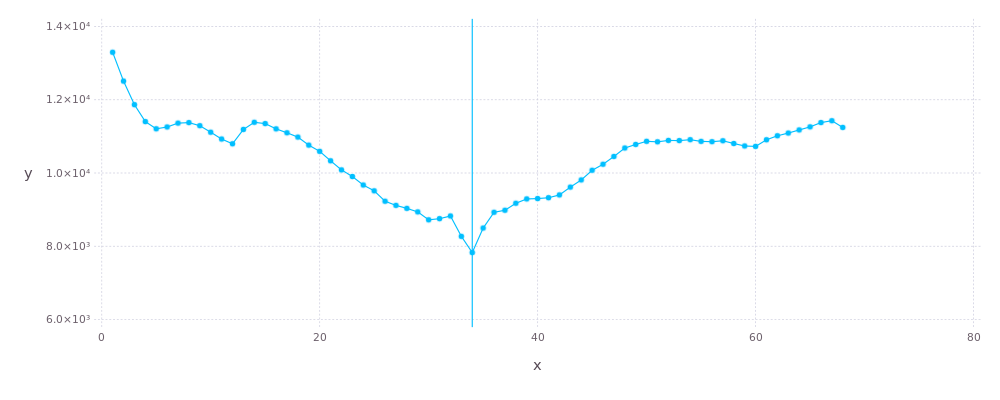

In [170]:
plot(x=1:ceil(Int, 2λ), y=γ[1:ceil(Int, 2λ)], xintercept=[λ], Geom.vline, Geom.line, Geom.point)

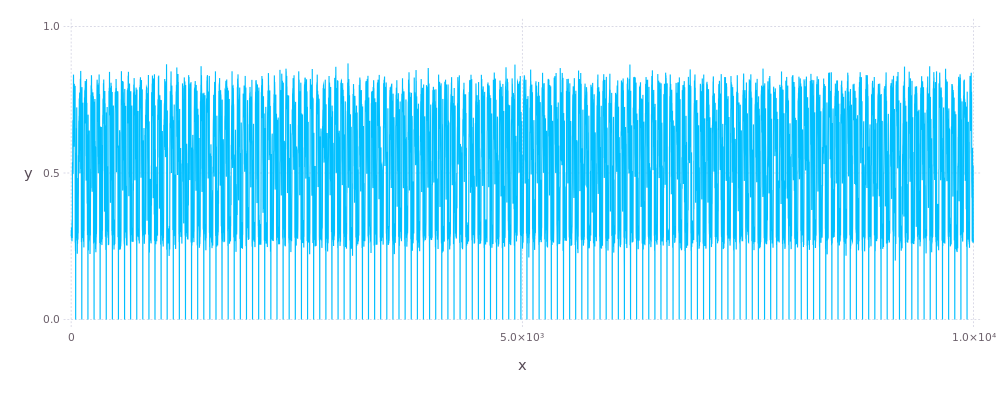

In [171]:
plot(x=1:length(σ), y=σ, Geom.line)

> ## Long QT interval
>
> The QT interval should be less than half of the R–R interval. Calculation of the corrected QT (QTc) is generally not necessary and usually will have been done by the ECG machine (but beware of blindly believing any automated diagnostic system). Conditions associated with a long QT interval are outlined in Table 3 (see Figure 18).

In [172]:
abnormal = false
n_qtrr = min(length(Qs), length(Ts), length(RRs))
QT_RRs = zeros(n_qtrr)
for i=1:n_qtrr
    #This is not the right definition of QT; it is not peak to peak, but start of Q to end of T
    QT_RRs[i] = (Ts[i]-Qs[i])/125/RRs[i]
    if QT_RRs[i] > 0.5
        abnormal = true
        #println("Beat $i exhibits Long QT: QT/RR ratio: ", round(QT_RRs[i], 3), " > 0.5")
    end
end
println("Mean QT/RR ratio: ", round(mean(QT_RRs), 3), " ± ", round(std(QT_RRs)/√(n_qtrr-1), 3))

Mean QT/RR ratio: 0.

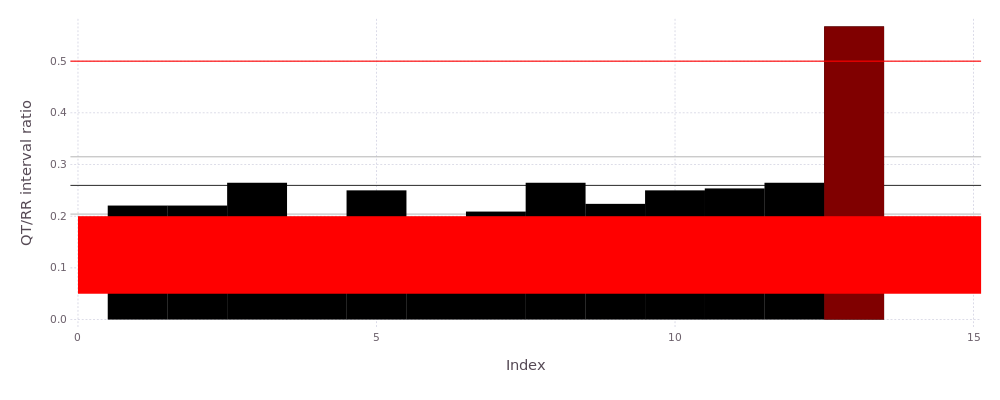

In [173]:
viz(QT_RRs, 0.5, label="QT/RR interval ratio")

Interact.Slider{Float64}(Signal{Float64}(0.5, nactions=0),"threshold",0.5,0.2:0.01:0.8,true)

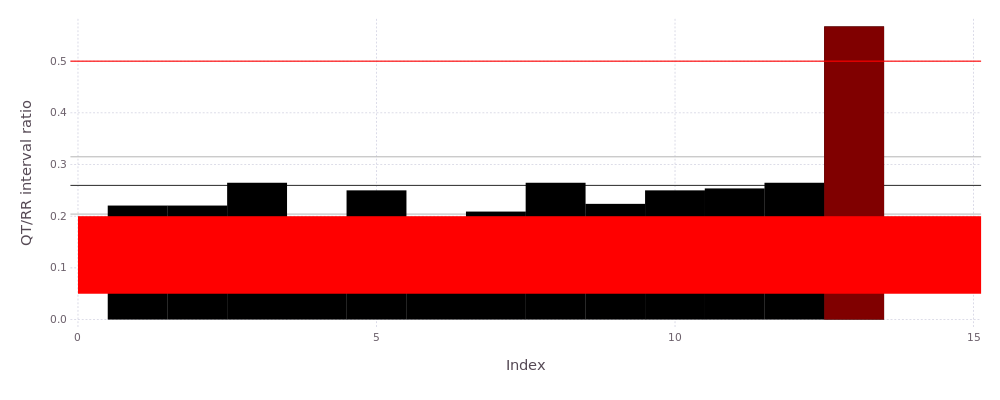

26 ± 0.028


In [174]:
@manipulate for threshold=0.2:0.01:0.8
    viz(QT_RRs, threshold, label="QT/RR interval ratio")
end

> ## T waves
> 
> In a normal ECG, T waves are upright in every lead except aVR. T-wave inversion can represent current ischemia or previous infarction (see Figure 17). In combination with LVH and ST depression, it can represent "strain". This form of LVH carries a poor prognosis.

In [175]:
if inverted
    println("T-wave inversion detected")
else
    println("T-wave inversion not detected")
end

T-wave inversion not detected


> ## Long PR interval
>
>A distance of more than five small squares from the start of the P wave to the start of the R wave (or Q wave if there is one) constitutes first-degree heart block (see Figure 10). It rarely requires action, but in the presence of other abnormalities might be a sign of hyperkalemia, digoxin toxicity, or cardiomyopathy.

1 small square = 0.04s, 1 large square = 0.20s.


In [176]:
#Again we cheat and use peak to peak instead of start to start.
#
abnormal = false
n_pr = min(length(Ps), length(Rs))
PRs = zeros(n_pr)
for i=1:n_pr
    PRs[i] = (Rs[i]-Ps[i])/125
    if !(0.12 < PRs[i] < 0.22)
        abnormal = true
        println("Beat $i shows evidence of first-degree heart block: PR interval = ",
            round(PRs[i], 3), "s which is not in the interval [0.12s, 0.22s]")
    end
end
println("PR interval: ", round(mean(PRs), 5), " ± ", round(std(PRs)/√(n_pr-1), 5), " s")
if mean(PRs) < 0.12
    println("""PR interval is very short. Either the atria have been depolarized from close to the AV node, or there is abnormally fast conduction from the atria to the ventricles.""")
end

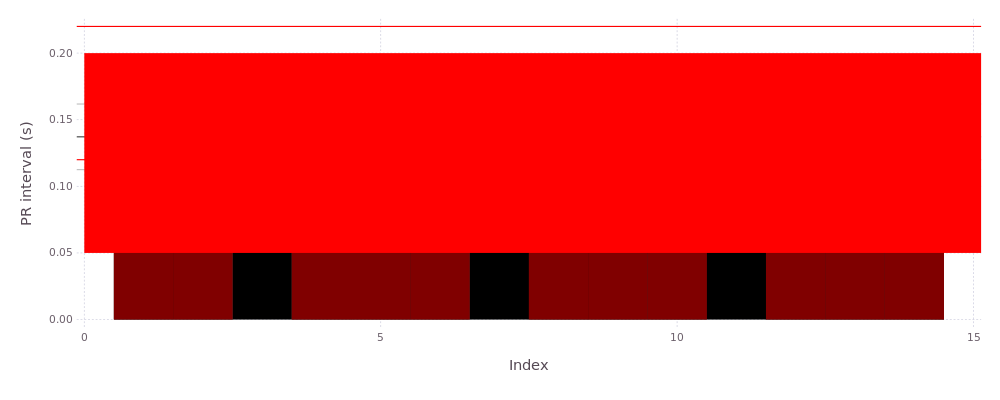

Beat 3 shows evidence of first-degree heart block: PR interval = 0.056s which is not in the interval [0.12s, 0.22s]
Beat 7 shows evidence of first-degree heart block: PR interval = 0.056s which is not in the interval [0.12s, 0.22s]
Beat 11 shows evidence of first-degree heart block: PR interval = 0.056s which is not in the interval [0.12s, 0.22s]
PR interval: 0.13714 ± 0.0123 s


In [177]:
viz(PRs, [0.12, 0.22], label="PR interval (s)")

In [178]:
#plotraw((inverted ? (-1):(1))*data, 4500:6000, Ps, Qs, Rs, Ss, Ts, otherups, otherdps)

In [179]:
# Source: "ECG made easy", p 16
# Check normal QRS complex duration
QSthresh = 0.120
abnormal = false
n_qs = min(length(Qs), length(Ss))
QSs = zeros(n_qs)
for i=1:n_qs
    Δt = (Ss[i] - Qs[i])/125
    if Δt > QSthresh
        abnormal = true
        println("Abnormal QRS complex duration: ", round(Δt, 4), "s > ", QSthresh, "s")
    end
    QSs[i] = Δt
end
QSmean = mean(QSs)
QSerr = std(QSs)/√(n_qs-1)
println("Mean QRS complex duration: ", round(QSmean, 5), " ± ", round(QSerr, 5), "s")

Mean QRS complex duration: 0.

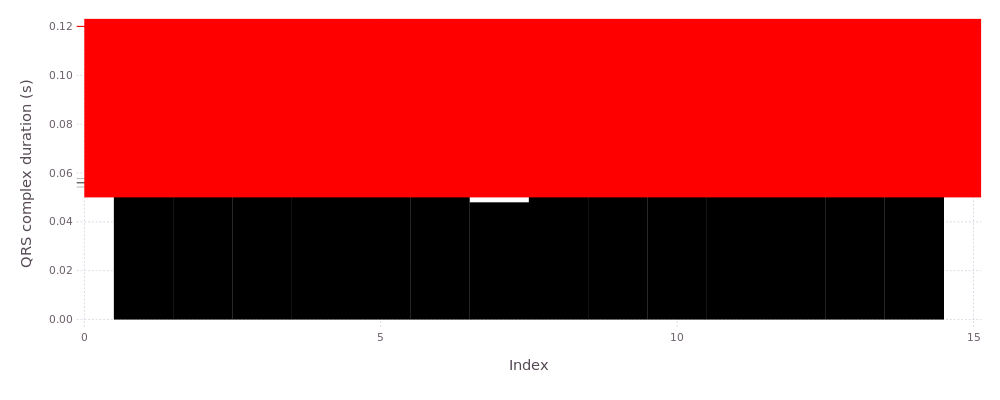

In [180]:
viz(QSs, QSthresh, label="QRS complex duration (s)")

In [181]:
# Source: "ECG made easy", p 17
# Check normal QTc duration
#
# There are several corrections used (see Wikipedia)
# Bazett's
# QTc = QT/√RR should have units of ms/s^1/2 but is always reported in ms. :(
# Fridericia
# QTc = QT/3√RR (similar units issue)
# Framingham heart study
# QTc = QT + 0.154(1-RR)

abnormal = false
n_qt = min(length(Qs), length(Ts), length(RRs))
QTs = zeros(n_qt)
QTcBs = zeros(n_qt)
QTcFs = zeros(n_qt)
QTcLs = zeros(n_qt)
for i=1:n_qt
    Δt = (Ts[i] - Qs[i])/125
    QTs[i] = Δt

    RR = RRs[i]
    
    ΔtB = Δt/√RR
    if ΔtB > 0.450
        abnormal = true
        println("Abnormal QTc complex duration (Bazett's correction): ", round(ΔtB, 4), " s > 0.45s")
    end
    QTcBs[i] = ΔtB

    ΔtF = Δt/RR
    if ΔtF > 0.450
        abnormal = true
        println("Abnormal QTc complex duration (Frederica's correction): ", round(ΔtF, 4), " s > 0.45s")
    end
    QTcFs[i] = ΔtF
    
    ΔtL = Δt + 0.154*(1-RR)
    if ΔtL > 0.450
        abnormal = true
        println("Abnormal QTc complex duration (Framingham correction): ", round(ΔtL, 4), " s > 0.45s")
    end
    QTcLs[i] = ΔtL

end
println("Mean QT (uncorrected) duration: ", round(mean(QTs), 5), " ± ", round(std(QTs)/√(n_qt-1), 5), " s")
println("Mean QTc (Bazett) duration: ", round(mean(QTcBs), 5), " ± ", round(std(QTcBs)/√(n_qt-1), 5), " s")
println("Mean QTc (Frederica) duration: ", round(mean(QTcFs), 5), " ± ", round(std(QTcFs)/√(n_qt-1), 5), " s")
println("Mean QTc (Framingham) duration: ", round(mean(QTcLs), 5), " ± ", round(std(QTcLs)/√(n_qt-1), 5), " s")

056 ± 0.00087s
Abnormal QTc complex duration (Frederica's correction): 0.

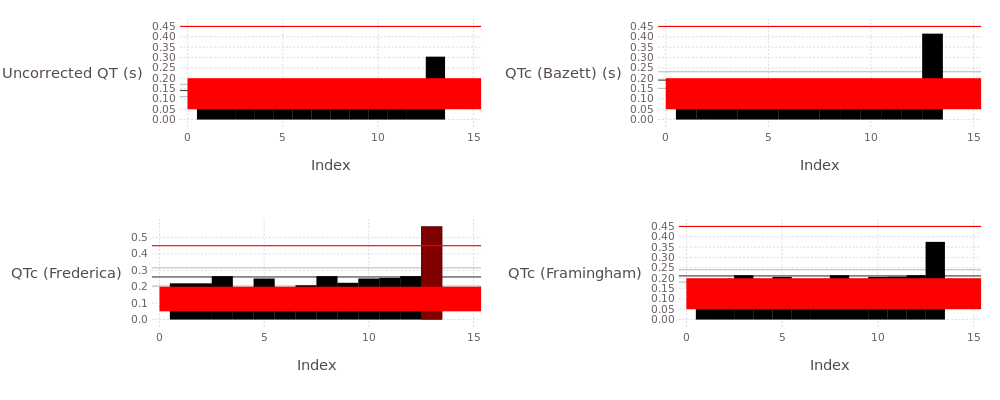

In [182]:
QTthresh = 0.45
vstack(
    hstack(
        viz(QTs, QTthresh, label="Uncorrected QT (s)"),
        viz(QTcBs, QTthresh, label="QTc (Bazett) (s)"),
    ), hstack(
        viz(QTcFs, QTthresh, label="QTc (Frederica)"),
        viz(QTcLs, QTthresh, label="QTc (Framingham)"),
    )
)

In [183]:
# Source: "ECG made easy", p 102 
# Check normal Q wave duration
# longer than 1mm ÷ 25mm/s = 0.04s = myocardial infarction
#Cheat and look at QR interval
abnormal = false
n_qr = min(length(Qs), length(Rs))
QRs = zeros(n_qr)
for i=1:n_qs
    Δt = (Rs[i] - Qs[i])/125
    if Δt > 0.04
        abnormal = true
        println("Abnormal Q wave duration: ", round(Δt, 4), " s > 0.04s")
    end
    QRs[i] = Δt
end
println("Mean Q wave duration: ", round(mean(QRs), 5), " ± ", round(std(QRs)/√(n_qr-1), 5), " s")

5672 s > 0.45s
Mean QT (uncorrected) duration: 0.14031 ± 0.01481 s
Mean QTc (Bazett) duration: 0.19083 ± 0.02026 s
Mean QTc (Frederica) duration: 0.25956 ± 0.02773 s
Mean QTc (Framingham) duration: 0.21101 ± 0.01485 s
Mean Q wave duration: 0.

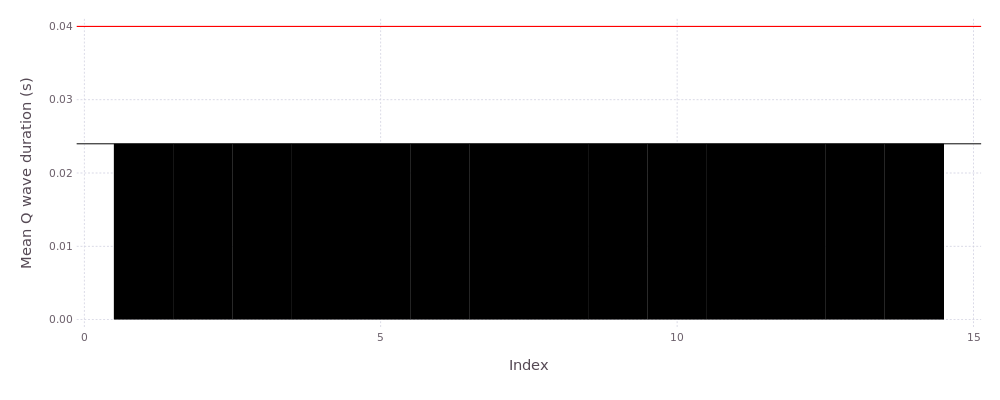

In [184]:
viz(QRs, 0.04; label="Mean Q wave duration (s)")

In [185]:
features = Float64[]
push!(features, mean(bpm .> 103.4))
push!(features, σxRR > 0.02)
push!(features, mean(QT_RRs .> 0.5))
push!(features, mean(0.12 .< PRs .< 0.22))
push!(features, mean(QSs .> 0.12))
push!(features, mean(QTcBs .> 0.45))
push!(features, mean(QRs .> 0.04))
features

7-element Array{Float64,1}:
 1.0      
 0.0      
 0.0769231
 0.785714 
 0.0      
 0.0      
 0.0      